# Benckmarking Dataset 2

In [1]:
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import os
import time
import logging
from sklearn.linear_model import LinearRegression
from scipy.spatial import distance_matrix

import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm
import shutil
from sklearn.metrics.pairwise import cosine_similarity

# silence scanpy that prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

import sys
sys.path.append('../src')
from utils import *

# Preprocessing MERFISH Mouse brain section 1 data
We use a single-cell resolution MERFISH Mouse brain dataset to generate a simulated dataset. The raw MEREFISH Mouse brain dataset is available in [here](https://cellxgene.cziscience.com/collections/31937775-0602-4e52-a799-b6acdd2bac2e). Conveniently, we provided the pre-pocessed benchmarking Dataset 2 (demo_data/MERFISH_MBA_sp.h5ad and demo_data/MERFISH_MBA_scref.h5ad) as well as other relevent materials involved in the following example in [here](https://drive.google.com/drive/folders/1PXv_brtr-tXshBVEd_HSPIagjX9oF7Kg?usp=sharing)

In [4]:
sp_adata = sc.read('../demo_data/MERFISH_MBA_sp.h5ad')
sc_adata = sc.read('../demo_data/MERFISH_MBA_scref.h5ad')

In [5]:
sp_adata.obs.head()

,fov,x,y,min_x,max_x,min_y,max_y,age,clust_annot,slice,...,is_primary_data,cell_type_annot,cell_type,assay,disease,organism,sex,tissue,self_reported_ethnicity,development_stage
70250253392092245615313362195123687952,361,4653.14721,-4520.894524,4645.124810209871,4661.169609823823,-4527.063924023509,-4514.725124320388,24wk,MSN-D1-1,0,...,True,MSN,medium spiny neuron,MERFISH,normal,Mus musculus,female,striatum,na,24 weeks
272120858201434631981626836733044897941,361,4673.03971,-4565.148523,4670.521809598804,4675.557609477639,-4569.028923013806,-4561.268123200536,24wk,Olig-2,0,...,True,Olig,oligodendrocyte,MERFISH,normal,Mus musculus,female,striatum,na,24 weeks
144848652052223101541799771566333388442,362,4668.35271,-4332.394024,4663.218809774518,4673.486609527468,-4337.527923771739,-4327.260124018789,24wk,MSN-D1-1,0,...,True,MSN,medium spiny neuron,MERFISH,normal,Mus musculus,female,striatum,na,24 weeks
301794780900628072164580549954868527118,362,4656.09021,-4308.305024,4650.683810076118,4661.496609815955,-4313.438924351334,-4303.171124598384,24wk,MSN-D2,0,...,True,MSN,medium spiny neuron,MERFISH,normal,Mus musculus,female,striatum,na,24 weeks
258697558314628872561967548757079667169,363,4668.29821,-4254.692021,4663.654809764028,4672.941609540581,-4258.517920860648,-4250.866121044755,24wk,Olig-2,0,...,True,Olig,oligodendrocyte,MERFISH,normal,Mus musculus,female,striatum,na,24 weeks


In [6]:
sp_adata.obs['cell_type_annot'].value_counts()

ExN      1144
Olig      682
MSN       449
Astro     428
InN       221
Endo      210
Peri      130
Micro      93
OPC        79
Vlmc       53
Name: cell_type_annot, dtype: int64

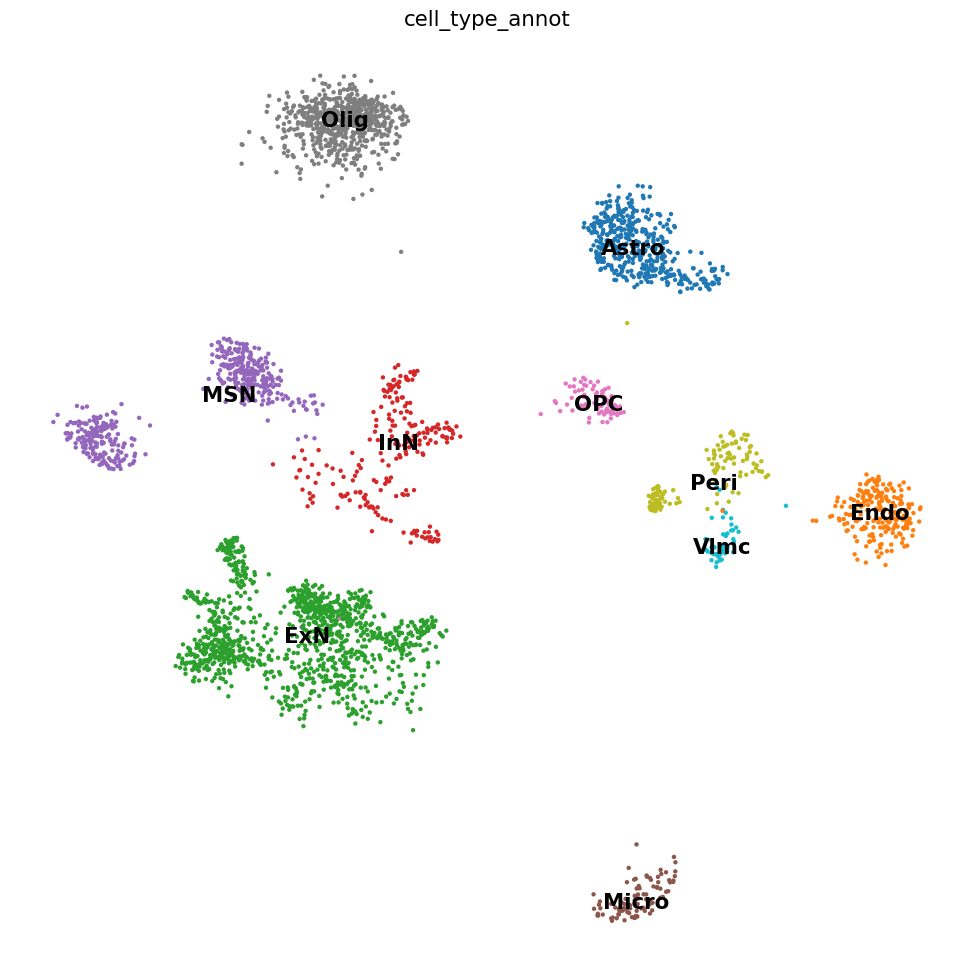

In [7]:
sns.set_context('paper',font_scale=1.6) 

fig, axs = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.umap(
    sp_adata, color="cell_type_annot", size=40, frameon=False, show=False, ax=axs,legend_loc='on data'
)
plt.tight_layout()

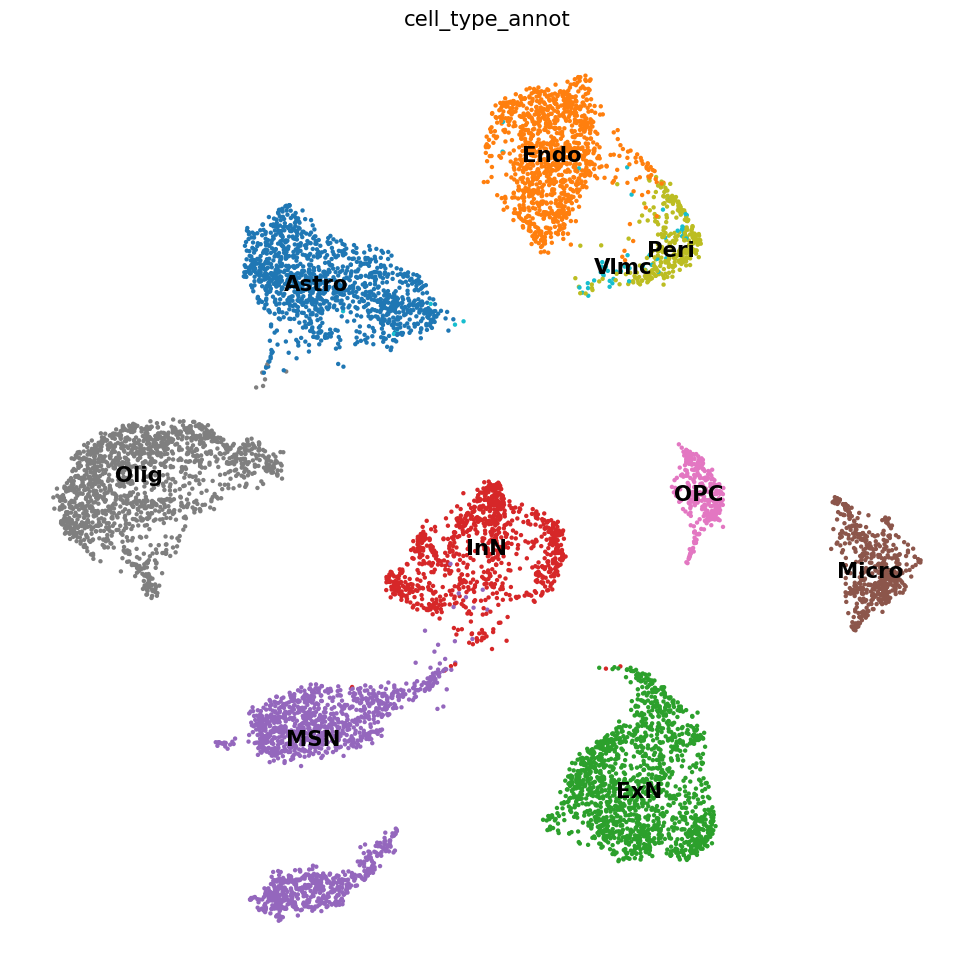

In [8]:
sns.set_context('paper',font_scale=1.6) 

fig, axs = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.umap(
    sc_adata, color="cell_type_annot", size=40, frameon=False, show=False, ax=axs,legend_loc='on data'
)
plt.tight_layout()

In [9]:
color_dict = {'Astro': '#1f77b4',
 'Endo': '#aec7e8',
 'Epen': '#ffbb78',
 'ExN': '#98df8a',
 'InN': '#d62728',
 'MSN': '#ff7f0e',
 'Macro': '#9467bd',
 'Micro': '#ff9896',
 'OPC': '#e377c2',
 'Olig': '#c5b0d5',
 'Peri': '#8c564b',
 'T cell': '#c49c94',
 'Vlmc': '#17becf'}
labelnames = ['Astro',
 'Endo',
 'ExN',
 'InN',
 'MSN',
 'Micro',
 'OPC',
 'Olig',
 'Peri',
 'Vlmc']

In [10]:
np.unique(sp_adata.obs.cell_type_annot)

array(['Astro', 'Endo', 'ExN', 'InN', 'MSN', 'Micro', 'OPC', 'Olig',
       'Peri', 'Vlmc'], dtype=object)

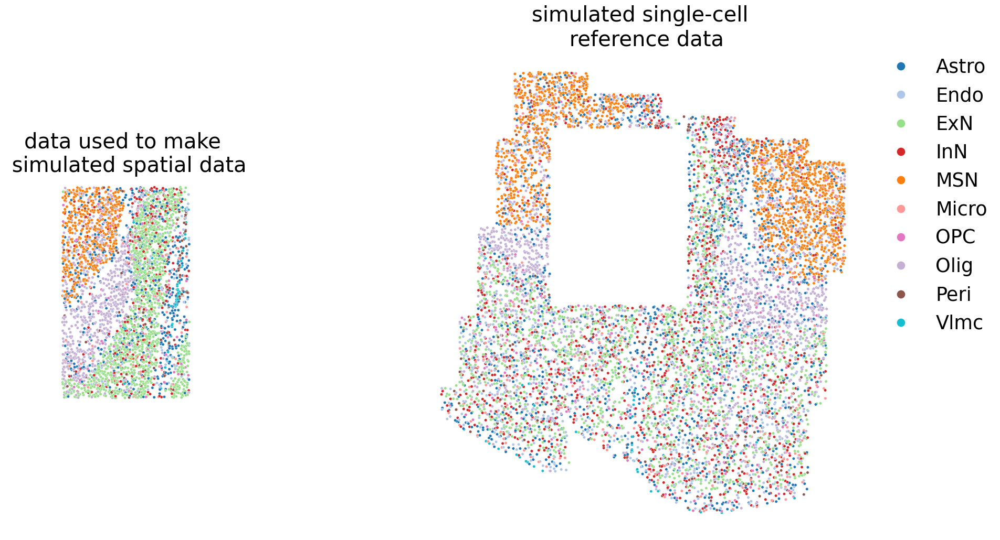

In [11]:
# visualize the data 
sns.set_context('paper',font_scale=3) 
plt.rcParams["legend.markerscale"] = 3

plt.figure(figsize=(24, 12),dpi = 100)
ax1 = plt.subplot(4,6,(8,14))
ax2 = plt.subplot(1,2,2)
ax = [ax1, ax2]

sns.scatterplot(data=sp_adata.obs, x="x", y="y", hue='cell_type_annot', s = 15, palette = color_dict, ax = ax[0], legend = False)
ax[0].set_title('data used to make \n simulated spatial data')
ax[0].invert_yaxis()
ax[0].axis('off')
# ax[0].legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, frameon=False)
sns.scatterplot(data=sc_adata.obs, x="x", y="y", hue='cell_type_annot', s = 15, palette = color_dict, ax = ax[1])
ax[1].set_title('simulated single-cell \n reference data')
ax[1].invert_yaxis()
ax[1].axis('off')
ax[1].legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, frameon=False)

# Generate fake spatial data 

In [12]:
sp_adata = sc.read('../demo_data/MERFISH_MBA_sp.h5ad')
sc_adata = sc.read('../demo_data/MERFISH_MBA_scref.h5ad')
sp_cell_class_column = cell_class_column = 'cell_type_annot'

In [13]:
x_min = sp_adata.obs['x'].min()
x_max = sp_adata.obs['x'].max()
y_min = sp_adata.obs['y'].min()
y_max = sp_adata.obs['y'].max()

((x_min, x_max), (y_min, y_max))

((4650.258710086346, 6148.888712525368),
 (-4599.91952227056, -3000.2465222626925))

In [14]:
(y_max - y_min) / (x_max - x_min)

1.0674235784712691

In [15]:
x_seg

NameError: name 'x_seg' is not defined

In [ ]:
x_seg

In [ ]:
x_min = sp_adata.obs['x'].min()
x_max = sp_adata.obs['x'].max()
y_min = sp_adata.obs['y'].min()
y_max = sp_adata.obs['y'].max()

num_x = 48
num_y = 48

spatial_adata =  sp_adata.copy()

# make grid 
x_seg = np.linspace(x_min, x_max, num_x)
y_seg = np.linspace(y_min, y_max, num_y)

with mpl.rc_context({'figure.figsize': (8, 8), 'figure.dpi': 150}):
    ax = sns.scatterplot(data=spatial_adata.obs, x="x", y="y", hue=sp_cell_class_column, s = 25, palette = color_dict, legend = False)
    ax.invert_yaxis()
    for i in range(x_seg.shape[0]):
        ax.plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = 1, alpha = 0.5)
    for i in range(y_seg.shape[0]):    
        ax.plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = 1, alpha = 0.5)
#         ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.axis('off')

<AxesSubplot:ylabel='Density'>

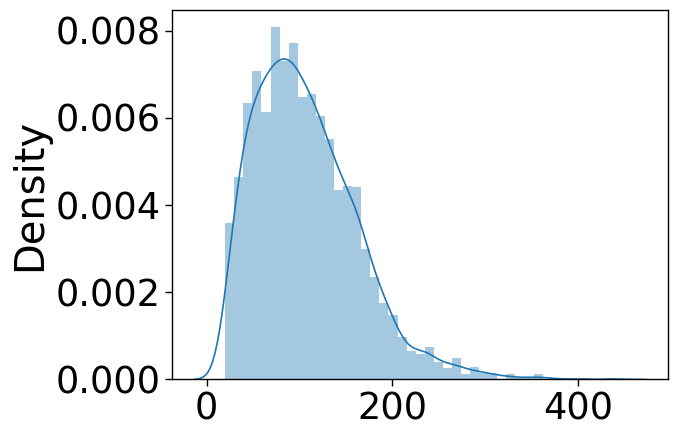

In [16]:
sns.distplot(sp_adata.X.sum(1))

In [17]:
mean_UMI = sp_adata.X.sum(1).mean()
print(mean_UMI)
sample_UMIs = [int(0.5 * mean_UMI), int(1.0 * mean_UMI), int(2.0 * mean_UMI)]
print(sample_UMIs)

107.23904
[53, 107, 214]


In [18]:
base_path = '/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48'

x_min = sp_adata.obs['x'].min()
x_max = sp_adata.obs['x'].max()
y_min = sp_adata.obs['y'].min()
y_max = sp_adata.obs['y'].max()

num_x = 48
num_y = 48


# make grid 
x_seg = np.linspace(x_min, x_max, num_x)
y_seg = np.linspace(y_min, y_max, num_y)

for sample_UMI in sample_UMIs:
    spatial_adata =  sp_adata.copy()
    
    # create fake spatial data with 'cell_locations' in uns (We assume the truth cell number in each fake spot is known in simulation study, thus skip "Nuclei segmentation" step in SpatialScope)
    spatial_adata = add_spot_label(spatial_adata, x_seg, y_seg, location_X_column = 'x', location_Y_column = 'y')
    generated_spot_adata = generate_spot_adata_func(spatial_adata, sample_UMI = sample_UMI)
    print(f'cell number range: {np.unique(generated_spot_adata.obs.cell_nums)}')

    temp_obs = rename_cell_locations_obs(spatial_adata)
    generated_spot_adata.uns['cell_locations'] = temp_obs

    # filter spot that UMI counts smaller than 20
    generated_spot_adata_filtered = generated_spot_adata.copy()[~(generated_spot_adata.X.sum(1) < 20)]

    index = ~generated_spot_adata.uns['cell_locations']['spot_index_int'].isin(np.where(generated_spot_adata.X.sum(1) < 20)[0])
    generated_spot_adata_filtered.uns['cell_locations'] = generated_spot_adata.uns['cell_locations'][index].copy()
    
    # save data 
    save_data_dir = os.path.join(base_path, f'{int(sample_UMI)}UMI')
    if not os.path.exists(save_data_dir):
        os.mkdir(save_data_dir)
    ## spatial
    generated_spot_adata_filtered.obsm['spatial'] = generated_spot_adata_filtered.obs[['x','y']].values
    generated_spot_adata_filtered.obs_names_make_unique()
    generated_spot_adata_filtered.var_names_make_unique()
    save_sp_dir = os.path.join(save_data_dir, 'spatial.h5ad')
    print(f'saved simulated spatial data of subsample {sample_UMI} UMI in {save_sp_dir}')
    generated_spot_adata_filtered.write(save_sp_dir)

cell number range: [1 2 3 4 5 6]


FileNotFoundError: [Errno 2] No such file or directory: '/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/53UMI'

## Run SpatialScope

```
declare -a arr=("0" "5" "10" "20" "30" "40" "50" "60" "70" "80" "90" "100" "120" "150" "200" "500" "1000")

for rep in {0..9}

do 

for i in 0 5 10 20 30 40 50 60 70 80 90 100 120 150 200 500 1000

do

python ./src/Cell_Type_Identification.py \
--cell_class_column cell_type_annot \
--tissue "rep$rep" \
--out_dir /home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI \
--ST_Data /home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/spatial.h5ad \
--SC_Data ../demo_data/MERFISH_MBA_scref.h5ad \
--hs_ST \
--UMI_min_sigma 100 \
--nu $i

done
done
```

# Vis Results

In [ ]:
DataDir = os.path.join(base_path, str(sample_UMIs[1]) + 'UMI')
sp_adata = sc.read(os.path.join(DataDir, 'spatial.h5ad'))

In [ ]:
sp_adata.uns['cell_locations']

In [ ]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('default')

sns.set_context('paper',font_scale=1.6) 

with mpl.rc_context({'figure.figsize': (8, 8), 'figure.dpi': 150}):
    ax = sns.scatterplot(data=sp_adata.obs, x="x", y="y", hue='cell_nums', s = 70, palette = "rocket_r")
#     ax = sns.scatterplot(data=sp_adata.obs, x="X", y="Y", s = 50, palette = "rocket_r")
    ax.invert_yaxis()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.legend(bbox_to_anchor=(1,0.6), title = 'cell number', markerscale = 3)

In [ ]:
leiden_sp = sp_adata.copy()

sc.pp.log1p(leiden_sp)
sc.pp.scale(leiden_sp, max_value=10)
sc.tl.pca(leiden_sp, svd_solver='arpack')
sc.pl.pca(leiden_sp, color=sp_adata.var.index[10])
sc.pl.pca_variance_ratio(leiden_sp, log=True)
sc.pp.neighbors(leiden_sp, n_neighbors=10, n_pcs=40)
sc.tl.leiden(leiden_sp)

plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('default')

sns.set_context('paper',font_scale=1.6) 

with mpl.rc_context({'figure.figsize': (8, 8), 'figure.dpi': 150}):
    ax = sns.scatterplot(data=leiden_sp.obs, x="x", y="y", hue='leiden', s = 70, palette = 'tab20')
#     ax = sns.scatterplot(data=sp_adata.obs, x="X", y="Y", s = 50, palette = "rocket_r")
    ax.invert_yaxis()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.legend(bbox_to_anchor=(1,0.6), title = 'cell number', markerscale = 3)

## Run StarDist + RCTD

```
for rep in {0..9}

do 

python ./compared_methods/SDRCTD.py \
--out_dir /home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep$rep \
--ST_Data /home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/spatial.h5ad \
--SC_Data ../demo_data/MERFISH_MBA_scref.h5ad \
--cell_class_column cell_type_annot \
--cell_num_column cell_nums \
--hs_ST \

done

```

## StarDist + RCTD Results

In [85]:
DataDir

'/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI'

In [86]:
SR_dir = os.path.join(DataDir, 'rep0', 'SDRCTD_results')
SR_dir

'/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep0/SDRCTD_results'

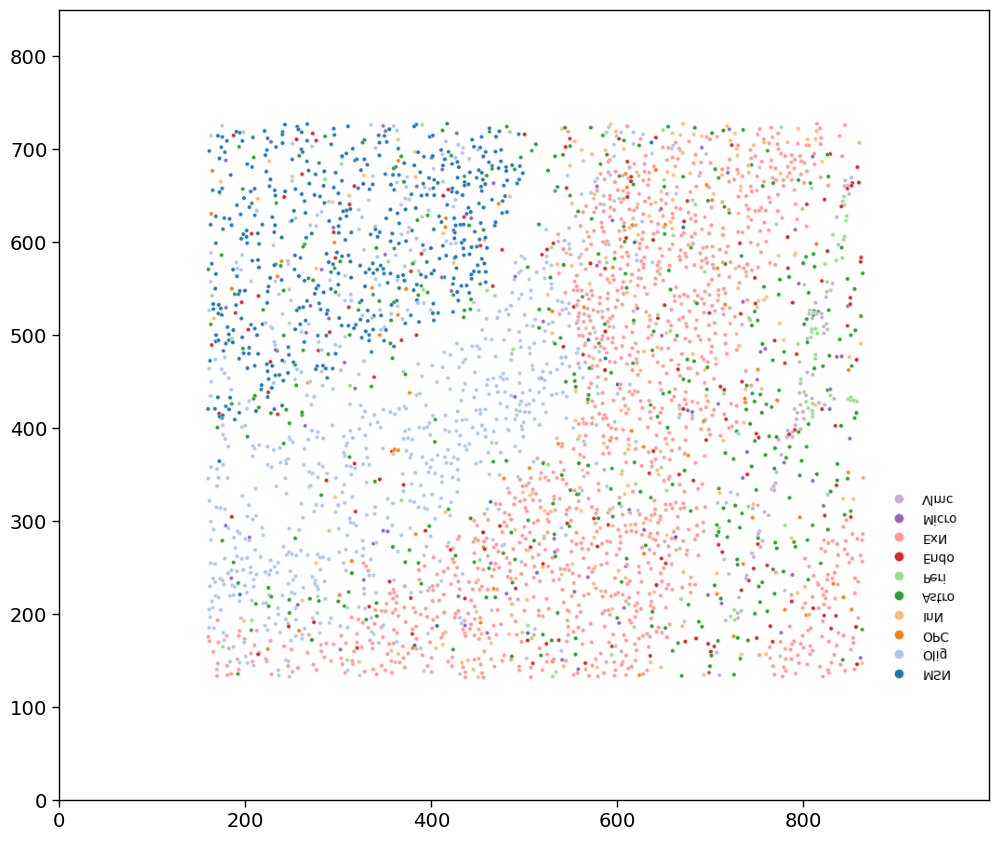

In [62]:
from matplotlib import pyplot as plt
from matplotlib import image 

fig, ax = plt.subplots(1,1, figsize=(12, 12))
img = image.imread(os.path.join(SR_dir, 'SDRCTD_estemated_ct_label.png'))
ax.imshow(img)
ax.invert_yaxis()
plt.show()

## nu test

In [87]:
def ssim(im1,im2,M=1):
    im1, im2 = im1/im1.max(), im2/im2.max()
    mu1 = im1.mean()
    mu2 = im2.mean()
    sigma1 = np.sqrt(((im1 - mu1) ** 2).mean())
    sigma2 = np.sqrt(((im2 - mu2) ** 2).mean())
    sigma12 = ((im1 - mu1) * (im2 - mu2)).mean()
    k1, k2, L = 0.01, 0.03, M
    C1 = (k1*L) ** 2
    C2 = (k2*L) ** 2
    C3 = C2/2
    l12 = (2*mu1*mu2 + C1)/(mu1 ** 2 + mu2 ** 2 + C1)
    c12 = (2*sigma1*sigma2 + C2)/(sigma1 ** 2 + sigma2 ** 2 + C2)
    s12 = (sigma12 + C3)/(sigma1*sigma2 + C3)
    ssim = l12 * c12 * s12
    return ssim

def rmse(x1,x2):
    return mean_squared_error(x1,x2,squared=False)
def mae(x1,x2):
    return np.mean(np.abs(x1-x2))

from collections.abc import Iterable
def compare_results(gd,result_list,metric='pcc',columns=None,axis=1):
    if metric=='pcc':
        func = pearsonr
        r_ind = 0
    if metric=='mae':
        func = mae
        r_ind = None
    if metric=='jsd':
        func = jensenshannon
        r_ind = None
    if metric=='rmse':
        func = rmse
        r_ind = None
    if metric=='ssim':
        func = ssim
        r_ind = None
    if isinstance(result_list, pd.DataFrame):
        c_list = []
        if axis == 1:
            print('axis: ',1)
            for i,c in enumerate(gd.columns):
                r = func(gd.iloc[:,i].values, np.clip(result_list.iloc[:,i],0,1))
                if isinstance(result_list, Iterable):
                    if r_ind is not None:
                        r = r[r_ind]
                c_list.append(r)
        else:
            print('axis: ',0)
            for i,c in enumerate(gd.index):
                r = func(gd.iloc[i,:].values, np.clip(result_list.iloc[i,:],0,1))
                if isinstance(result_list, Iterable):
                    if r_ind is not None:
                        r = r[r_ind]
                c_list.append(r)
        df = pd.DataFrame(c_list,index=gd.columns,columns=columns)
    else:
        df_list = []
        for res in result_list:
            c_list = []
            if axis == 1:
                for i,c in enumerate(gd.columns):
                    r = func(gd.iloc[:,i].values, np.clip(res.iloc[:,i],0,1))
                    if isinstance(res, Iterable):
                        if r_ind is not None:
                            r = r[r_ind]
                    c_list.append(r)
                df_tmp = pd.DataFrame(c_list,index=gd.columns)
            else:
                for i,c in enumerate(gd.index):
                    r = func(gd.iloc[i,:].values, np.clip(res.iloc[i,:],0,1))
                    if isinstance(res, Iterable):
                        if r_ind is not None:
                            r = r[r_ind]
                    c_list.append(r)
                df_tmp = pd.DataFrame(c_list,index=gd.index)
            df_list.append(df_tmp)
        df = pd.concat(df_list,axis=1)
        df.columns = columns
    return df


In [88]:
def label_to_matrix(spot_label, label):
    matrix = pd.DataFrame(index = np.unique(spot_label), columns = np.unique(np.array(label)))
    for i in np.unique(spot_label):
        each_spot_prop_df = pd.DataFrame(index = np.unique(np.array(label)))
        each_spot_prop_df['prop'] = np.zeros(each_spot_prop_df.shape[0])
        index = spot_label == i
        val, counts = np.unique(label[index], return_counts=True)
        each_spot_prop_df.loc[val, 'prop'] = counts
        matrix.loc[i,:] = each_spot_prop_df.values.squeeze()

    return matrix

gd_results = label_to_matrix(np.array(sp_adata.uns['cell_locations']['spot_index_int']), np.array(sp_adata.uns['cell_locations'][sp_cell_class_column]))
gd_results = (gd_results.T/gd_results.sum(axis=1)).T
gd_results = gd_results.fillna(0)

In [97]:
nu_list = [0, 5] + np.arange(10,110,10).tolist() + [120, 150, 200, 500, 1000] + ['RCTD']

error_rate_df = pd.DataFrame(columns = {'error_rate', 'nu', 'rep'})
decon_df = pd.DataFrame()
decon_pcc_df = pd.DataFrame()
decon_rmse_df = pd.DataFrame()

for j, nu in enumerate(nu_list):
    for i, rep in enumerate(range(10)):
        print(f"nu = {nu}; rep = {rep}")
        
        with open(os.path.join(DataDir, 'rep' + str(rep), 'InitProp.pickle'), 'rb') as handle:
            InitProp = pickle.load(handle)

        RCTD_results = (InitProp['results'] / np.array(InitProp['results'].sum(1))[:, None])
        RCTD_results = RCTD_results.loc[:, np.unique(RCTD_results.columns)]
        if rep == 0:
            print(os.path.join(DataDir, 'rep' + str(rep), 'RCTD_results.txt'))
            RCTD_results.to_csv(os.path.join(DataDir, 'rep' + str(rep), 'RCTD_results.txt'))
            
        if nu == 'RCTD':  
            SR_results = sc.read(os.path.join(DataDir, 'rep' + str(rep), 'SDRCTD_results/single_cell_type_label_bySDRCTD.h5ad'))
            SR_cell_type_label = SR_results.uns['cell_locations'].copy()

            estimated = np.array(SR_cell_type_label['SDRCTD_cell_type'])
            estimated = np.array([_.replace('_','/') for _ in estimated])
            tl = np.array(SR_cell_type_label[sp_cell_class_column])
            error_index = tl != estimated
            SR_cell_type_label['error'] = (error_index).astype(int) 
            RCTD_error_rate = np.where((error_index).astype(int) == 1)[0].shape[0]/ error_index.shape[0]
            error_rate_df.loc[len(error_rate_df.index)] = {'error_rate': RCTD_error_rate, 'nu': nu, 'rep': int(rep)}
        else:
            # palette = ['#F0EFF6', '#D0E2F8', '#c44e52']
            cell_locations = pd.read_csv(os.path.join(DataDir, 'rep' + str(rep), 'CellTypeLabel_nu' + str(nu) + '.csv'), index_col = 0)

            prop = label_to_matrix(np.array(cell_locations['spot_index_int']), np.array(cell_locations['discrete_label_ct']))
            prop = prop/prop.sum(1)[:,None]

            SpatialScope_results = prop
            SpatialScope_results.index = np.arange(len(RCTD_results))
            SpatialScope_results = SpatialScope_results.loc[:,np.unique(SpatialScope_results.columns)]
            print(os.path.join(DataDir, 'rep' + str(rep), 'SpatialScope_result'+ '_nu' + str(nu) +'.txt'))
            SpatialScope_results.to_csv(os.path.join(DataDir, 'rep' + str(rep), 'SpatialScope_result'+ '_nu' + str(nu) +'.txt'))


            starmap_spots_pcc = compare_results(
                gd_results,
                [RCTD_results,SpatialScope_results],
                columns = ['RCTD', 'SpatialScope'],
                axis=0,
                metric='pcc'
            )

            starmap_spots_rmse = compare_results(
                gd_results,
                [RCTD_results,SpatialScope_results],
                columns = ['RCTD', 'SpatialScope'],
                axis=0,
                metric='rmse'
            )

            starmap_spots_pcc['nu'] = [nu] * starmap_spots_pcc.shape[0]
            starmap_spots_pcc['metric'] = ['pcc'] * starmap_spots_pcc.shape[0]
            starmap_spots_rmse['nu'] = [nu] * starmap_spots_rmse.shape[0]
            starmap_spots_rmse['metric'] = ['rmse'] * starmap_spots_rmse.shape[0]

            decon_df = pd.concat([decon_df, starmap_spots_pcc, starmap_spots_rmse], axis = 0)
            decon_pcc_df = pd.concat([decon_pcc_df, starmap_spots_pcc], axis = 0)
            decon_rmse_df = pd.concat([decon_rmse_df, starmap_spots_rmse], axis = 0)


            estimated = np.array(cell_locations['discrete_label_ct'])
            estimated = np.array([_.replace('_','/') for _ in estimated])
            tl = np.array(cell_locations[sp_cell_class_column])
            error_index = tl != estimated
            cell_locations['error'] = (error_index).astype(int) 
            error_rate = np.where((error_index).astype(int) == 1)[0].shape[0]/ error_index.shape[0]
            error_rate_df.loc[len(error_rate_df.index)] = {'error_rate': error_rate, 'nu': int(nu), 'rep': int(rep)}
        

nu = 0; rep = 0
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep0/RCTD_results.txt
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep0/SpatialScope_result_nu0.txt
nu = 0; rep = 1
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep1/SpatialScope_result_nu0.txt
nu = 0; rep = 2
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep2/SpatialScope_result_nu0.txt
nu = 0; rep = 3
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep3/SpatialScope_result_nu0.txt
nu = 0; rep = 4
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep4/SpatialScope_result_nu0.txt
nu = 0; rep = 5
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep5/SpatialScope_result_nu0.txt
nu = 0; rep = 6
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep6/SpatialScope_result_nu0.txt
nu = 0; rep = 7
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep7/SpatialScope_result_

In [ ]:
nu_list = [0, 5] + np.arange(10,110,10).tolist() + [120, 150, 200, 500, 1000]

decon_df_SR = pd.DataFrame()
decon_pcc_df_SR = pd.DataFrame()
decon_rmse_df_SR = pd.DataFrame()


for j, nu in enumerate(nu_list):
    for i, rep in enumerate(range(10)):
        print(f"nu = {nu}; rep = {rep}")
        SR_results = sc.read(os.path.join(DataDir, 'rep' + str(rep), 'SDRCTD_results/single_cell_type_label_bySDRCTD.h5ad'))
        SR_cell_type_label = SR_results.uns['cell_locations'].copy()
        
        prop = label_to_matrix(np.array(SR_cell_type_label['spot_index_int']), np.array(SR_cell_type_label['SDRCTD_cell_type']))
        prop = prop/prop.sum(1)[:,None]
        
        SR_results = prop
        SR_results.index = np.arange(len(SR_results))
        SR_results = SR_results.loc[:,np.unique(SR_results.columns)]
        if nu == 0:
            print(os.path.join(DataDir, 'rep' + str(rep), 'SR_result'+ '_nu' + str(nu) +'.txt'))
            SR_results.to_csv(os.path.join(DataDir, 'rep' + str(rep), 'SR_result'+ '_nu' + str(nu) +'.txt'))
            
        starmap_spots_pcc = compare_results(
            gd_results,
            [SR_results],
            columns = ['SR'],
            axis=0,
            metric='pcc'
        )

        starmap_spots_rmse = compare_results(
            gd_results,
            [SR_results],
            columns = ['SR'],
            axis=0,
            metric='rmse'
        )
        decon_df_SR = pd.concat([decon_df_SR, starmap_spots_pcc, starmap_spots_rmse], axis = 0)
        decon_pcc_df_SR = pd.concat([decon_pcc_df_SR, starmap_spots_pcc], axis = 0)
        decon_rmse_df_SR = pd.concat([decon_rmse_df_SR, starmap_spots_rmse], axis = 0)

nu = 0; rep = 0
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep0/SR_result_nu0.txt
nu = 0; rep = 1
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep1/SR_result_nu0.txt
nu = 0; rep = 2
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep2/SR_result_nu0.txt
nu = 0; rep = 3
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep3/SR_result_nu0.txt
nu = 0; rep = 4
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep4/SR_result_nu0.txt
nu = 0; rep = 5
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep5/SR_result_nu0.txt
nu = 0; rep = 6
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep6/SR_result_nu0.txt
nu = 0; rep = 7
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep7/SR_result_nu0.txt
nu = 0; rep = 8
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep8/SR_result_nu0.txt
nu = 0; rep = 9
/home/share/xwanaf/sour_sep/revision/da

In [194]:
decon_df_temp = decon_df.copy()
decon_df_temp['SR'] = decon_df_SR.SR.tolist()
decon_pcc_df_temp = decon_pcc_df.copy()
decon_pcc_df_temp['SR'] = decon_pcc_df_SR.SR.tolist()
decon_rmse_df_temp = decon_rmse_df.copy()
decon_rmse_df_temp['SR'] = decon_rmse_df_SR.SR.tolist()

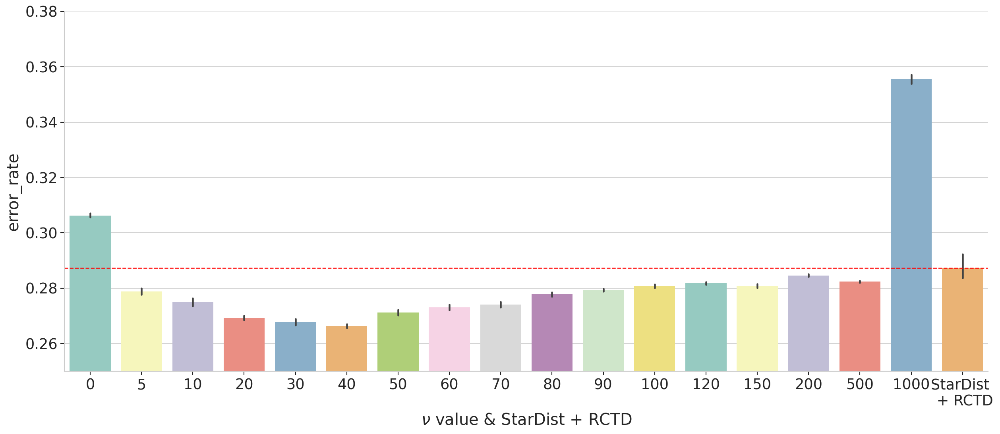

In [157]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('seaborn-whitegrid')

sns.set_context('paper',font_scale=2) 
fig, ax = plt.subplots(1,1, figsize = (20, 8), dpi = 150)
plt.subplots_adjust(hspace = 0.5)

with plt.style.context('seaborn-whitegrid'):
#     sns.barplot(x="nu", y="error_rate",hue='subsample',data=vis_df[(vis_df['correct_label'])&(vis_df['cell_num']==1)], palette="Set3", ax = ax)
    sns.barplot(x="nu", y="error_rate",data=error_rate_df, palette="Set3", ax = ax)
ax.set_ylim(0.25,0.38)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticklabels(nu_list[:-1] + ['StarDist \n + RCTD'])

plt.xlabel(r'$\nu$ value & StarDist + RCTD')
plt.axhline(y=error_rate_df[error_rate_df['nu'] == 'RCTD'].error_rate.mean(), color='r', linestyle='--')
plt.show()

In [201]:
nu = 0
rep = 0


SR_results = sc.read(os.path.join(DataDir, 'rep' + str(rep), 'SDRCTD_results/single_cell_type_label_bySDRCTD.h5ad'))
SR_cell_type_label = SR_results.uns['cell_locations'].copy()

estimated = np.array(SR_cell_type_label['SDRCTD_cell_type'])
estimated = np.array([_.replace('_','/') for _ in estimated])
tl = np.array(SR_cell_type_label[sp_cell_class_column])
error_index = tl != estimated
SR_cell_type_label['error'] = (error_index).astype(int) 
RCTD_error_rate = np.where((error_index).astype(int) == 1)[0].shape[0]/ error_index.shape[0]

# palette = ['#F0EFF6', '#D0E2F8', '#c44e52']
cell_locations = pd.read_csv(os.path.join(DataDir, 'rep' + str(rep), 'CellTypeLabel_nu' + str(nu) + '.csv'), index_col = 0)
estimated = np.array(cell_locations['discrete_label_ct'])
estimated = np.array([_.replace('_','/') for _ in estimated])
tl = np.array(cell_locations[sp_cell_class_column])
error_index = tl != estimated
cell_locations['error'] = (error_index).astype(int) 
error_rate = np.where((error_index).astype(int) == 1)[0].shape[0]/ error_index.shape[0]


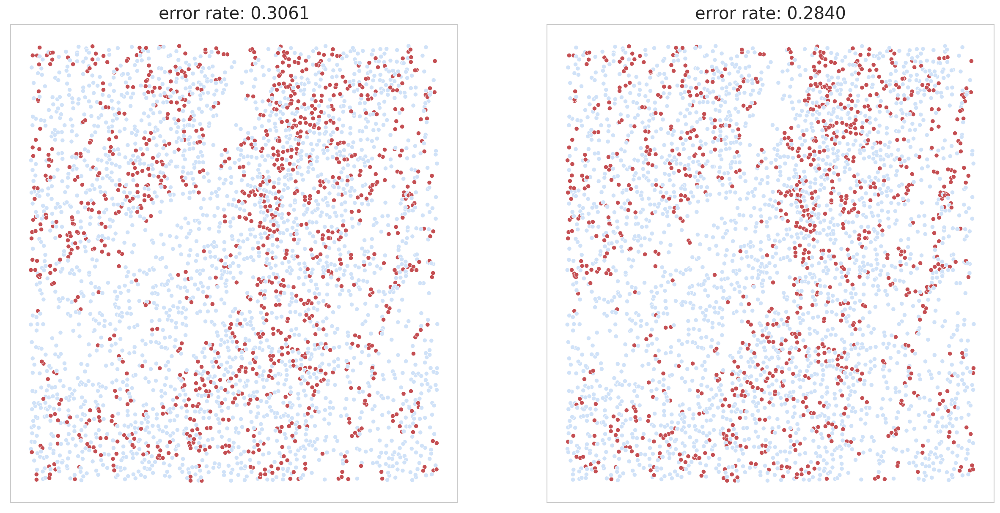

In [208]:
fig, ax = plt.subplots(1,2, figsize = (20, 10), dpi = 150)

sns.scatterplot(data=cell_locations, x="x", y="y", hue="error", s = 25, palette = ['#D0E2F8', '#c44e52'], ax = ax[0])
ax[0].invert_yaxis()
# ax.axis('off')
ax[0].set_title('error rate: {:.4f}'.format(error_rate))
ax[0].get_yaxis().set_visible(False)
ax[0].get_xaxis().set_visible(False)
ax[0].get_legend().remove()

sns.scatterplot(data=SR_cell_type_label, x="x", y="y", hue="error", s = 25, palette = ['#D0E2F8', '#c44e52'], ax = ax[1])
ax[1].invert_yaxis()
# ax.axis('off')
ax[1].set_title('error rate: {:.4f}'.format(RCTD_error_rate))
ax[1].get_yaxis().set_visible(False)
ax[1].get_xaxis().set_visible(False)
ax[1].get_legend().remove()

plt.show()
plt.close()

In [200]:
test_df

,nu,rep,error_rate
0,0,0,0.306105
1,0,1,0.306105
2,0,2,0.306678
3,0,3,0.305532
4,0,4,0.304958
...,...,...,...
175,RCTD,5,0.283749
176,RCTD,6,0.291488
177,RCTD,7,0.285469
178,RCTD,8,0.286615


In [216]:
test_sp_adata = sp_adata.copy()
test_df = decon_rmse_df_temp.copy()
test_df = test_df[test_df.nu == 0][:1753]

spot_name_array = test_sp_adata.obs.index
cell_num_multi = np.array(test_sp_adata.obs.cell_nums > 1)

## SS corrected spots

In [267]:
SS_correct_index = np.array(test_df.SpatialScope == 0)
selected_spots = spot_name_array[(SS_correct_index & cell_num_multi)]
cell_locations_vis = cell_locations.copy()[cell_locations['spot_index'].isin(selected_spots)]
SR_cell_type_label_vis = SR_cell_type_label.copy()[SR_cell_type_label['spot_index'].isin(selected_spots)]

print(f'SS: {(cell_locations_vis.error == 1).sum() / cell_locations_vis.shape[0]}')
print(f'SR: {(SR_cell_type_label_vis.error == 1).sum() / SR_cell_type_label_vis.shape[0]}')

SS: 0.3225035833731486
SR: 0.29479216435738176


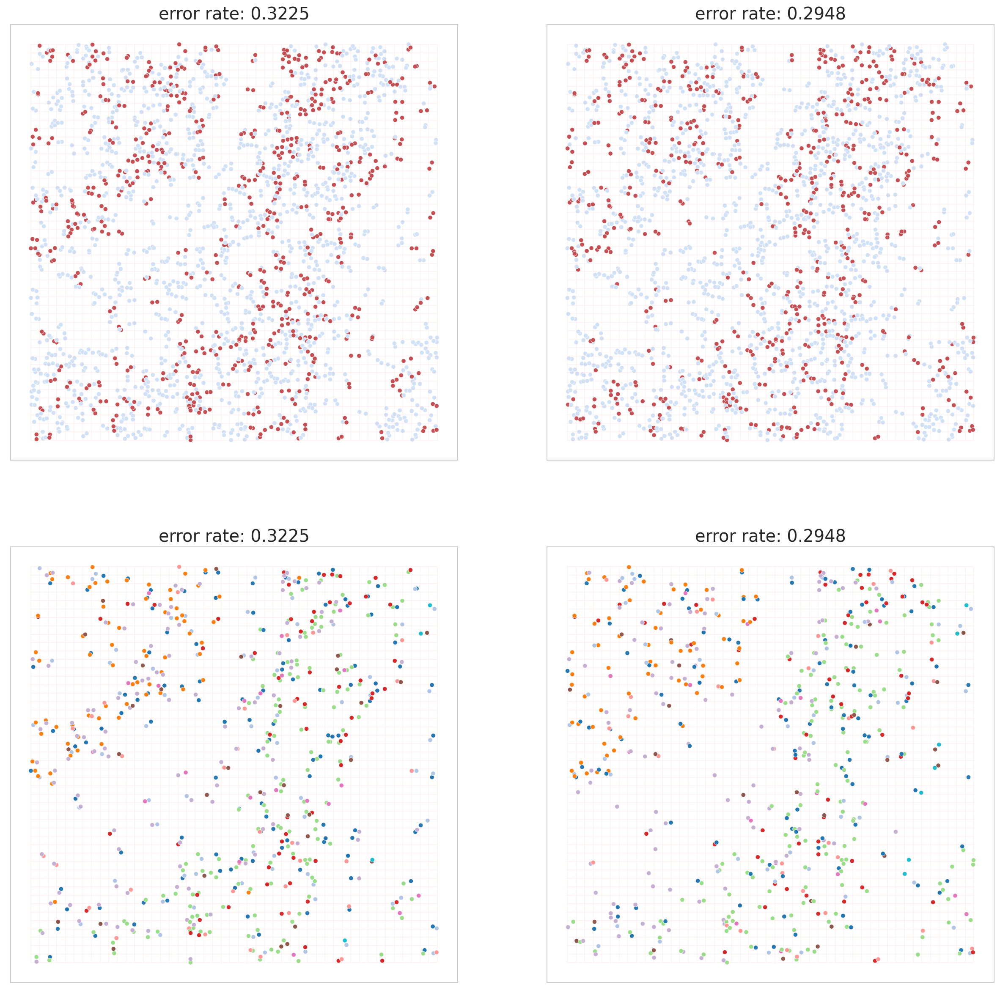

In [268]:
fig, ax = plt.subplots(2,2, figsize = (20, 20), dpi = 150)

sns.scatterplot(data=cell_locations_vis, x="x", y="y", hue="error", s = 25, palette = ['#D0E2F8', '#c44e52'], ax = ax[0, 0])
ax[0, 0].invert_yaxis()
# ax.axis('off')
ax[0, 0].set_title('error rate: {:.4f}'.format(((cell_locations_vis.error == 1).sum() / cell_locations_vis.shape[0])))
ax[0, 0].get_yaxis().set_visible(False)
ax[0, 0].get_xaxis().set_visible(False)
ax[0, 0].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[0, 0].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[0, 0].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)

sns.scatterplot(data=SR_cell_type_label_vis, x="x", y="y", hue="error", s = 25, palette = ['#D0E2F8', '#c44e52'], ax = ax[0, 1])
ax[0, 1].invert_yaxis()
# ax.axis('off')
ax[0, 1].set_title('error rate: {:.4f}'.format((SR_cell_type_label_vis.error == 1).sum() / SR_cell_type_label_vis.shape[0]))
ax[0, 1].get_yaxis().set_visible(False)
ax[0, 1].get_xaxis().set_visible(False)
ax[0, 1].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[0, 1].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[0, 1].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)


sns.scatterplot(data=cell_locations_vis[cell_locations_vis.error == 1], x="x", y="y", hue="discrete_label_ct", s = 25, palette = color_dict, ax = ax[1, 0])
ax[1, 0].invert_yaxis()
# ax.axis('off')
ax[1, 0].set_title('error rate: {:.4f}'.format((cell_locations_vis.error == 1).sum() / cell_locations_vis.shape[0]))
ax[1, 0].get_yaxis().set_visible(False)
ax[1, 0].get_xaxis().set_visible(False)
ax[1, 0].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[1, 0].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[1, 0].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)

sns.scatterplot(data=SR_cell_type_label_vis[SR_cell_type_label_vis.error == 1], x="x", y="y", hue="SDRCTD_cell_type", s = 25, palette = color_dict, ax = ax[1, 1])
ax[1, 1].invert_yaxis()
# ax.axis('off')
ax[1, 1].set_title('error rate: {:.4f}'.format((SR_cell_type_label_vis.error == 1).sum() / SR_cell_type_label_vis.shape[0]))
ax[1, 1].get_yaxis().set_visible(False)
ax[1, 1].get_xaxis().set_visible(False)
ax[1, 1].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[1, 1].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[1, 1].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)


In [269]:
SR_correct_index = np.array(test_df.SR == 0)
selected_spots = spot_name_array[(SR_correct_index & cell_num_multi)]
SR_cell_type_label_vis = SR_cell_type_label.copy()[SR_cell_type_label['spot_index'].isin(selected_spots)]
cell_locations_vis = cell_locations.copy()[cell_locations['spot_index'].isin(selected_spots)]

print(f'SS: {(cell_locations_vis.error == 1).sum() / cell_locations_vis.shape[0]}')
print(f'SR: {(SR_cell_type_label_vis.error == 1).sum() / SR_cell_type_label_vis.shape[0]}')

SS: 0.3086356668369954
SR: 0.2774655084312724


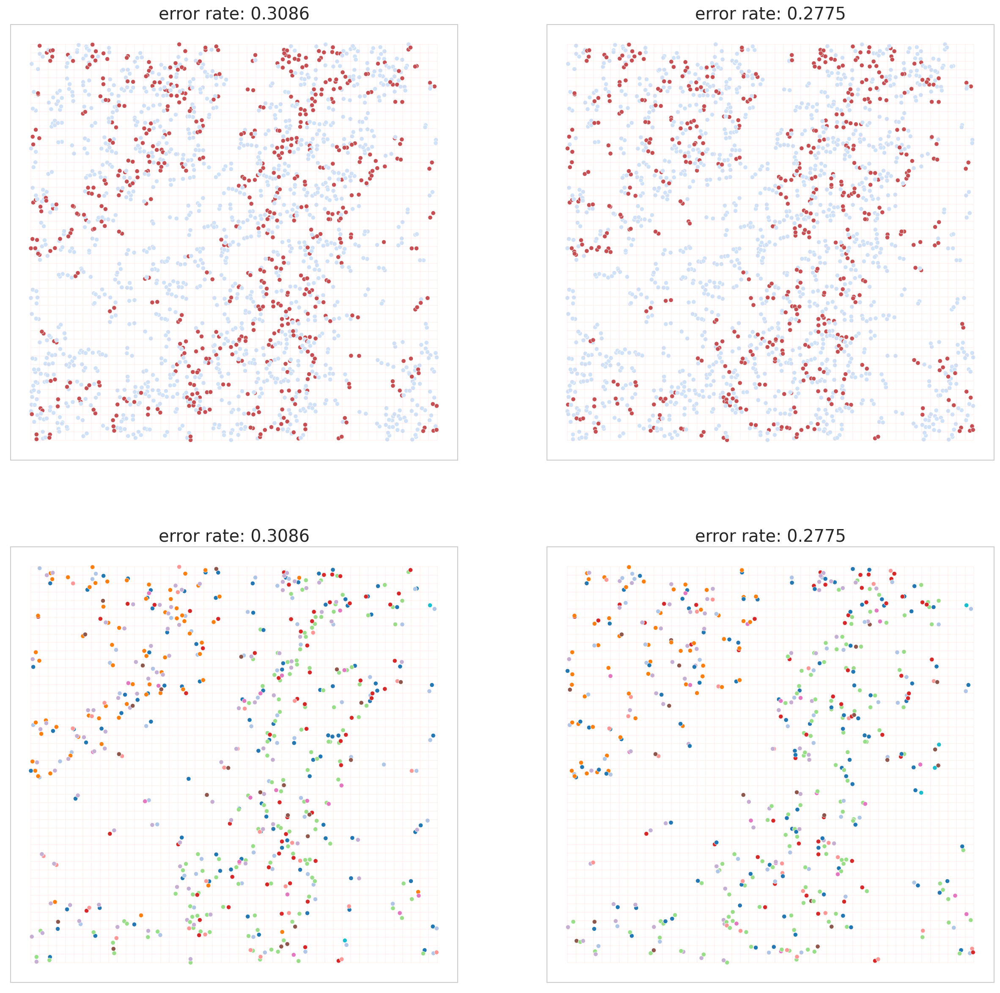

In [270]:
fig, ax = plt.subplots(2,2, figsize = (20, 20), dpi = 150)

sns.scatterplot(data=cell_locations_vis, x="x", y="y", hue="error", s = 25, palette = ['#D0E2F8', '#c44e52'], ax = ax[0, 0])
ax[0, 0].invert_yaxis()
# ax.axis('off')
ax[0, 0].set_title('error rate: {:.4f}'.format((cell_locations_vis.error == 1).sum() / cell_locations_vis.shape[0]))
ax[0, 0].get_yaxis().set_visible(False)
ax[0, 0].get_xaxis().set_visible(False)
ax[0, 0].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[0, 0].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[0, 0].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)

sns.scatterplot(data=SR_cell_type_label_vis, x="x", y="y", hue="error", s = 25, palette = ['#D0E2F8', '#c44e52'], ax = ax[0, 1])
ax[0, 1].invert_yaxis()
# ax.axis('off')
ax[0, 1].set_title('error rate: {:.4f}'.format((SR_cell_type_label_vis.error == 1).sum() / SR_cell_type_label_vis.shape[0]))
ax[0, 1].get_yaxis().set_visible(False)
ax[0, 1].get_xaxis().set_visible(False)
ax[0, 1].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[0, 1].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[0, 1].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)


sns.scatterplot(data=cell_locations_vis[cell_locations_vis.error == 1], x="x", y="y", hue="discrete_label_ct", s = 25, palette = color_dict, ax = ax[1, 0])
ax[1, 0].invert_yaxis()
# ax.axis('off')
ax[1, 0].set_title('error rate: {:.4f}'.format((cell_locations_vis.error == 1).sum() / cell_locations_vis.shape[0]))
ax[1, 0].get_yaxis().set_visible(False)
ax[1, 0].get_xaxis().set_visible(False)
ax[1, 0].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[1, 0].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[1, 0].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)

sns.scatterplot(data=SR_cell_type_label_vis[SR_cell_type_label_vis.error == 1], x="x", y="y", hue="SDRCTD_cell_type", s = 25, palette = color_dict, ax = ax[1, 1])
ax[1, 1].invert_yaxis()
# ax.axis('off')
ax[1, 1].set_title('error rate: {:.4f}'.format((SR_cell_type_label_vis.error == 1).sum() / SR_cell_type_label_vis.shape[0]))
ax[1, 1].get_yaxis().set_visible(False)
ax[1, 1].get_xaxis().set_visible(False)
ax[1, 1].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[1, 1].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[1, 1].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)


In [274]:
SS_SR_correct_index = np.array((test_df.SR == 0) & (test_df.SpatialScope == 0))
selected_spots = spot_name_array[(SS_SR_correct_index & cell_num_multi)]
SR_cell_type_label_vis = SR_cell_type_label.copy()[SR_cell_type_label['spot_index'].isin(selected_spots)]
cell_locations_vis = cell_locations.copy()[cell_locations['spot_index'].isin(selected_spots)]

print(f'SS: {(cell_locations_vis.error == 1).sum() / cell_locations_vis.shape[0]}')
print(f'SR: {(SR_cell_type_label_vis.error == 1).sum() / SR_cell_type_label_vis.shape[0]}')

SS: 0.30416447021613074
SR: 0.2783342119135477


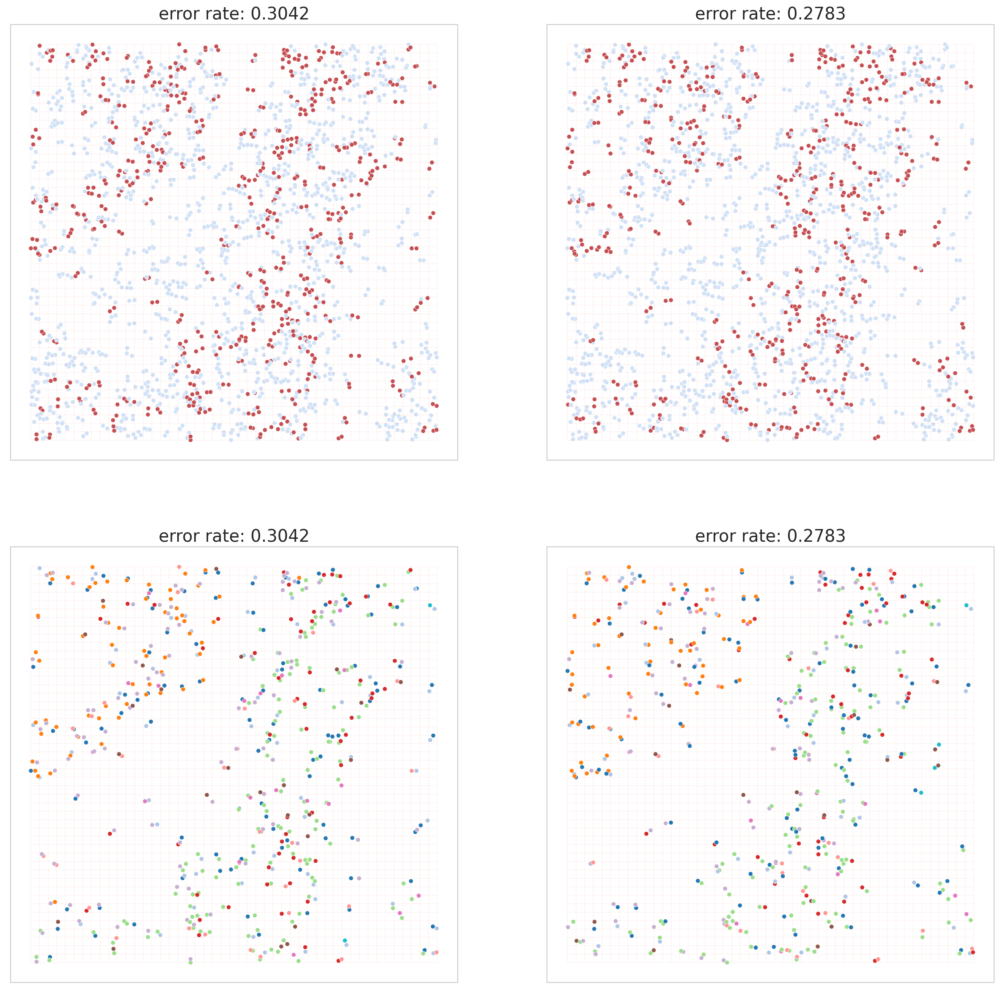

In [277]:
fig, ax = plt.subplots(2,2, figsize = (20, 20), dpi = 150)

sns.scatterplot(data=cell_locations_vis, x="x", y="y", hue="error", s = 25, palette = ['#D0E2F8', '#c44e52'], ax = ax[0, 0])
ax[0, 0].invert_yaxis()
# ax.axis('off')
ax[0, 0].set_title('error rate: {:.4f}'.format((cell_locations_vis.error == 1).sum() / cell_locations_vis.shape[0]))
ax[0, 0].get_yaxis().set_visible(False)
ax[0, 0].get_xaxis().set_visible(False)
ax[0, 0].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[0, 0].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[0, 0].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)

sns.scatterplot(data=SR_cell_type_label_vis, x="x", y="y", hue="error", s = 25, palette = ['#D0E2F8', '#c44e52'], ax = ax[0, 1])
ax[0, 1].invert_yaxis()
# ax.axis('off')
ax[0, 1].set_title('error rate: {:.4f}'.format((SR_cell_type_label_vis.error == 1).sum() / SR_cell_type_label_vis.shape[0]))
ax[0, 1].get_yaxis().set_visible(False)
ax[0, 1].get_xaxis().set_visible(False)
ax[0, 1].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[0, 1].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[0, 1].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)


sns.scatterplot(data=cell_locations_vis[cell_locations_vis.error == 1], x="x", y="y", hue="discrete_label_ct", s = 25, palette = color_dict, ax = ax[1, 0])
ax[1, 0].invert_yaxis()
# ax.axis('off')
ax[1, 0].set_title('error rate: {:.4f}'.format((cell_locations_vis.error == 1).sum() / cell_locations_vis.shape[0]))
ax[1, 0].get_yaxis().set_visible(False)
ax[1, 0].get_xaxis().set_visible(False)
ax[1, 0].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[1, 0].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[1, 0].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)

sns.scatterplot(data=SR_cell_type_label_vis[SR_cell_type_label_vis.error == 1], x="x", y="y", hue="SDRCTD_cell_type", s = 25, palette = color_dict, ax = ax[1, 1])
ax[1, 1].invert_yaxis()
# ax.axis('off')
ax[1, 1].set_title('error rate: {:.4f}'.format((SR_cell_type_label_vis.error == 1).sum() / SR_cell_type_label_vis.shape[0]))
ax[1, 1].get_yaxis().set_visible(False)
ax[1, 1].get_xaxis().set_visible(False)
ax[1, 1].get_legend().remove()
for i in range(x_seg.shape[0]):
    ax[1, 1].plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)
for i in range(y_seg.shape[0]):    
    ax[1, 1].plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .2, alpha = 0.5)


In [179]:
decon_rmse_df

,RCTD,SpatialScope,nu,metric
0,0.130152,0.149071,0,rmse
1,0.059191,0.000000,0,rmse
2,0.103507,0.000000,0,rmse
3,0.245723,0.447214,0,rmse
4,0.075976,0.000000,0,rmse
...,...,...,...,...
1748,0.080139,0.223607,1000,rmse
1749,0.057765,0.000000,1000,rmse
1750,0.057180,0.223607,1000,rmse
1751,0.066876,0.365148,1000,rmse


In [118]:
decon_pcc_df

,RCTD,SpatialScope,nu,metric
0,0.717509,0.715678,0,pcc
1,0.991034,1.000000,0,pcc
2,0.971187,1.000000,0,pcc
3,0.580610,-0.111111,0,pcc
4,0.936489,1.000000,0,pcc
...,...,...,...,...
1748,0.921799,0.666667,1000,pcc
1749,0.991206,1.000000,1000,pcc
1750,0.989247,0.666667,1000,pcc
1751,0.899591,-0.218218,1000,pcc


## SpatialScope & RCTD

In [119]:
vis_decon_df = pd.DataFrame()
vis_decon_df['value'] = decon_df.RCTD.tolist() + decon_df.SpatialScope.tolist() 
vis_decon_df['method'] = ['RCTD'] * decon_df.shape[0] + ['SpatialScope'] * decon_df.shape[0]
vis_decon_df['nu'] = decon_df.nu.tolist() * 2
vis_decon_df['metric'] = decon_df.metric.tolist() * 2

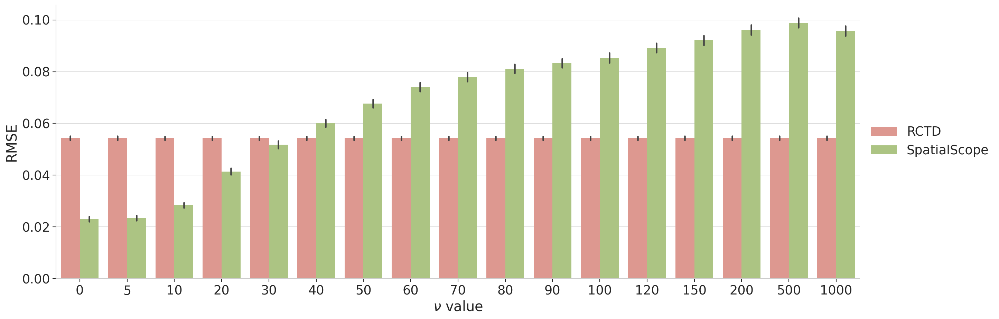

In [177]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('seaborn-whitegrid')

sns.set_context('paper',font_scale=2) 
fig, ax = plt.subplots(1,1, figsize = (20, 7), dpi = 150)
plt.subplots_adjust(hspace = 0.5)

with plt.style.context('seaborn-whitegrid'):
    sns.barplot(x="nu", y="value",hue='method',data=vis_decon_df[vis_decon_df.metric == 'rmse'], palette=['#EA8E83', '#AFCF78'], ax = ax)
# ax.set_ylim(0.4,0.95)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.legend(bbox_to_anchor=(1,0.6))
#ax.set_yticks([0.84, 0.86, 0.88])
#ax.set_xticklabels(['130 UMIs','260 UMIs','520 UMIs'])
plt.ylabel('RMSE')
plt.xlabel(r'$\nu$ value')
plt.show()

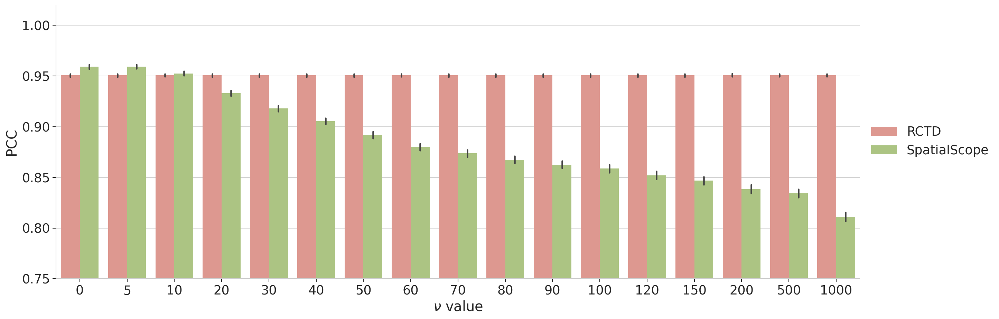

In [178]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('seaborn-whitegrid')

sns.set_context('paper',font_scale=2) 
fig, ax = plt.subplots(1,1, figsize = (20, 7), dpi = 150)
plt.subplots_adjust(hspace = 0.5)

with plt.style.context('seaborn-whitegrid'):
    sns.barplot(x="nu", y="value",hue='method',data=vis_decon_df[vis_decon_df.metric == 'pcc'], palette=['#EA8E83', '#AFCF78'], ax = ax)
ax.set_ylim(0.75,1.02)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.legend(bbox_to_anchor=(1,0.6))
#ax.set_yticks([0.84, 0.86, 0.88])
#ax.set_xticklabels(['130 UMIs','260 UMIs','520 UMIs'])
plt.ylabel('PCC')
plt.xlabel(r'$\nu$ value')
plt.show()

## SpatialScope & RCTD & StarDist + RCTD

In [195]:
vis_decon_df = pd.DataFrame()
vis_decon_df['value'] = decon_df_temp.RCTD.tolist() + decon_df_temp.SpatialScope.tolist() + decon_df_temp.SR.tolist()
vis_decon_df['method'] = ['RCTD'] * decon_df_temp.shape[0] + ['SpatialScope'] * decon_df_temp.shape[0] + ['StarDist+RCTD'] * decon_df_temp.shape[0]
vis_decon_df['nu'] = decon_df.nu.tolist() * 3
vis_decon_df['metric'] = decon_df.metric.tolist() * 3

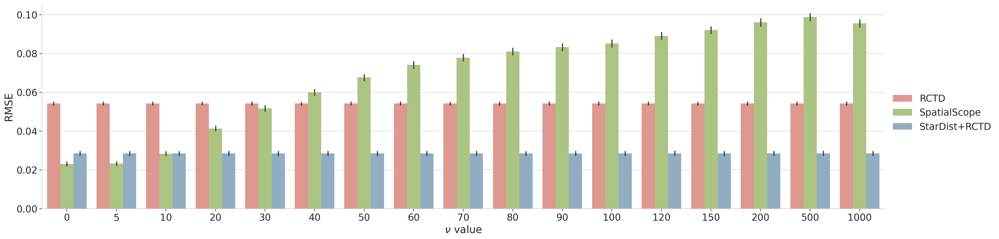

In [197]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('seaborn-whitegrid')

sns.set_context('paper',font_scale=2) 
fig, ax = plt.subplots(1,1, figsize = (28, 7), dpi = 150)
plt.subplots_adjust(hspace = 0.5)

with plt.style.context('seaborn-whitegrid'):
    sns.barplot(x="nu", y="value",hue='method',data=vis_decon_df[vis_decon_df.metric == 'rmse'], palette=['#EA8E83', '#AFCF78', '#8AAEC9'], ax = ax)
# ax.set_ylim(0.4,0.95)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.legend(bbox_to_anchor=(1,0.6))
#ax.set_yticks([0.84, 0.86, 0.88])
#ax.set_xticklabels(['130 UMIs','260 UMIs','520 UMIs'])
plt.ylabel('RMSE')
plt.xlabel(r'$\nu$ value')
plt.show()

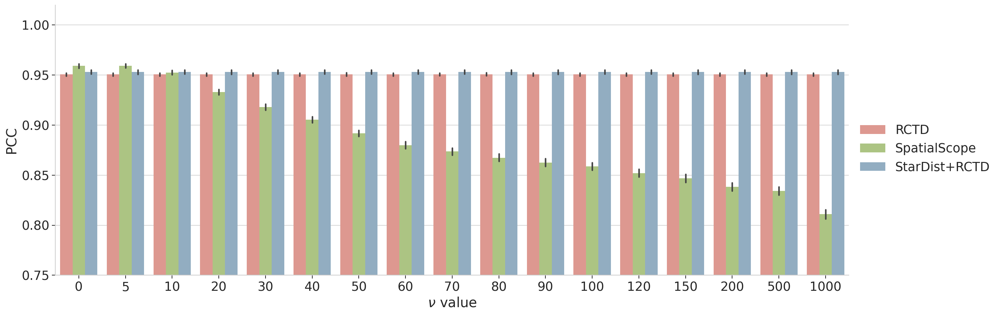

In [198]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('seaborn-whitegrid')

sns.set_context('paper',font_scale=2) 
fig, ax = plt.subplots(1,1, figsize = (20, 7), dpi = 150)
plt.subplots_adjust(hspace = 0.5)

with plt.style.context('seaborn-whitegrid'):
    sns.barplot(x="nu", y="value",hue='method',data=vis_decon_df[vis_decon_df.metric == 'pcc'], palette=['#EA8E83', '#AFCF78', '#8AAEC9'], ax = ax)
ax.set_ylim(0.75,1.02)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.legend(bbox_to_anchor=(1,0.6))
#ax.set_yticks([0.84, 0.86, 0.88])
#ax.set_xticklabels(['130 UMIs','260 UMIs','520 UMIs'])
plt.ylabel('PCC')
plt.xlabel(r'$\nu$ value')
plt.show()

# add nu = 0.000001

In [293]:
nu = 0.000001

small_nv_error_rate_df = error_rate_df.copy()
small_nv_decon_df = pd.DataFrame()
small_nv_decon_pcc_df = pd.DataFrame()
small_nv_decon_rmse_df = pd.DataFrame()
for i, rep in enumerate(range(10)):
    print(f"nu = {nu}; rep = {rep}")
    cell_locations = pd.read_csv(os.path.join(DataDir, 'rep' + str(rep), 'CellTypeLabel_nu' + str(nu) + '.csv'), index_col = 0)

    prop = label_to_matrix(np.array(cell_locations['spot_index_int']), np.array(cell_locations['discrete_label_ct']))
    prop = prop/prop.sum(1)[:,None]

    SpatialScope_results = prop
    SpatialScope_results.index = np.arange(len(RCTD_results))
    SpatialScope_results = SpatialScope_results.loc[:,np.unique(SpatialScope_results.columns)]
    print(os.path.join(DataDir, 'rep' + str(rep), 'SpatialScope_result'+ '_nu' + str(nu) +'.txt'))
    SpatialScope_results.to_csv(os.path.join(DataDir, 'rep' + str(rep), 'SpatialScope_result'+ '_nu' + str(nu) +'.txt'))


    starmap_spots_pcc = compare_results(
        gd_results,
        [SpatialScope_results],
        columns = ['SpatialScope'],
        axis=0,
        metric='pcc'
    )

    starmap_spots_rmse = compare_results(
        gd_results,
        [SpatialScope_results],
        columns = ['SpatialScope'],
        axis=0,
        metric='rmse'
    )

    starmap_spots_pcc['nu'] = [nu] * starmap_spots_pcc.shape[0]
    starmap_spots_pcc['metric'] = ['pcc'] * starmap_spots_pcc.shape[0]
    starmap_spots_rmse['nu'] = [nu] * starmap_spots_rmse.shape[0]
    starmap_spots_rmse['metric'] = ['rmse'] * starmap_spots_rmse.shape[0]

    small_nv_decon_df = pd.concat([small_nv_decon_df, starmap_spots_pcc, starmap_spots_rmse], axis = 0)
    small_nv_decon_pcc_df = pd.concat([small_nv_decon_pcc_df, starmap_spots_pcc], axis = 0)
    small_nv_decon_rmse_df = pd.concat([small_nv_decon_rmse_df, starmap_spots_rmse], axis = 0)


    estimated = np.array(cell_locations['discrete_label_ct'])
    estimated = np.array([_.replace('_','/') for _ in estimated])
    tl = np.array(cell_locations[sp_cell_class_column])
    error_index = tl != estimated
    cell_locations['error'] = (error_index).astype(int) 
    error_rate = np.where((error_index).astype(int) == 1)[0].shape[0]/ error_index.shape[0]
    small_nv_error_rate_df.loc[len(small_nv_error_rate_df.index)] = {'error_rate': error_rate, 'nu': nu, 'rep': int(rep)}

nu = 1e-06; rep = 0
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep0/SpatialScope_result_nu1e-06.txt
nu = 1e-06; rep = 1
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep1/SpatialScope_result_nu1e-06.txt
nu = 1e-06; rep = 2
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep2/SpatialScope_result_nu1e-06.txt
nu = 1e-06; rep = 3
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep3/SpatialScope_result_nu1e-06.txt
nu = 1e-06; rep = 4
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep4/SpatialScope_result_nu1e-06.txt
nu = 1e-06; rep = 5
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep5/SpatialScope_result_nu1e-06.txt
nu = 1e-06; rep = 6
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep6/SpatialScope_result_nu1e-06.txt
nu = 1e-06; rep = 7
/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep7/SpatialScope_result_nu1e-06.txt
nu = 1e-06; rep 

In [294]:
small_nv_error_rate_df

,nu,rep,error_rate
0,0,0,0.306105
1,0,1,0.306105
2,0,2,0.306678
3,0,3,0.305532
4,0,4,0.304958
...,...,...,...
185,0.000001,5,0.287475
186,0.000001,6,0.286902
187,0.000001,7,0.286615
188,0.000001,8,0.290341


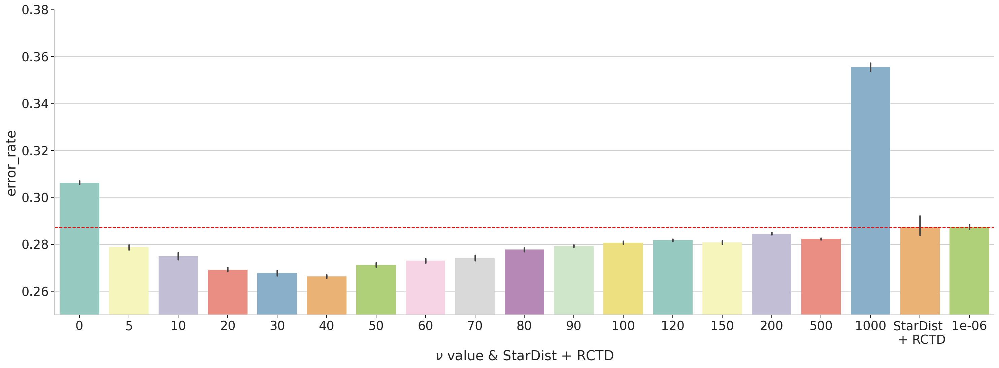

In [302]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('seaborn-whitegrid')

sns.set_context('paper',font_scale=2) 
fig, ax = plt.subplots(1,1, figsize = (24, 8), dpi = 150)
plt.subplots_adjust(hspace = 0.5)

with plt.style.context('seaborn-whitegrid'):
#     sns.barplot(x="nu", y="error_rate",hue='subsample',data=vis_df[(vis_df['correct_label'])&(vis_df['cell_num']==1)], palette="Set3", ax = ax)
    sns.barplot(x="nu", y="error_rate",data=small_nv_error_rate_df, palette="Set3", ax = ax)
ax.set_ylim(0.25,0.38)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticklabels(nu_list + ['StarDist \n + RCTD'] + [str(0.000001)])

plt.xlabel(r'$\nu$ value & StarDist + RCTD')
plt.axhline(y=error_rate_df[error_rate_df['nu'] == 'RCTD'].error_rate.mean(), color='r', linestyle='--')
plt.show()

In [313]:
temp = decon_df_temp.copy()
temp = temp[(temp.nu == 0)]
temp['nu'] = [str(0.000001)] * temp.shape[0]
temp['SpatialScope'] = small_nv_decon_df.SpatialScope.tolist()

temp = pd.concat([temp, decon_df_temp.copy()], axis = 0)
temp

,RCTD,SpatialScope,nu,metric,SR
0,0.717509,0.715678,1e-06,pcc,0.715678
1,0.991034,1.000000,1e-06,pcc,1.000000
2,0.971187,1.000000,1e-06,pcc,1.000000
3,0.580610,-0.111111,1e-06,pcc,-0.111111
4,0.936489,1.000000,1e-06,pcc,1.000000
...,...,...,...,...,...
1748,0.080139,0.223607,1000,rmse,0.000000
1749,0.057765,0.000000,1000,rmse,0.000000
1750,0.057180,0.223607,1000,rmse,0.000000
1751,0.066876,0.365148,1000,rmse,0.000000


In [331]:
temp

,RCTD,SpatialScope,nu,metric,SR
0,0.717509,0.715678,1e-06,pcc,0.715678
1,0.991034,1.000000,1e-06,pcc,1.000000
2,0.971187,1.000000,1e-06,pcc,1.000000
3,0.580610,-0.111111,1e-06,pcc,-0.111111
4,0.936489,1.000000,1e-06,pcc,1.000000
...,...,...,...,...,...
1748,0.080139,0.223607,1000,rmse,0.000000
1749,0.057765,0.000000,1000,rmse,0.000000
1750,0.057180,0.223607,1000,rmse,0.000000
1751,0.066876,0.365148,1000,rmse,0.000000


In [328]:
DataDir

'/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI'

In [329]:
# temp.to_csv(os.path.join(DataDir, 'decon_df.csv'))
# small_nv_error_rate_df.to_csv(os.path.join(DataDir, 'error_rate_df.csv'))

## SpatialScope & RCTD & StarDist + RCTD & nv = 0.0000001

In [317]:
vis_decon_df = pd.DataFrame()
vis_decon_df['value'] = temp.RCTD.tolist() + temp.SR.tolist() + temp.SpatialScope.tolist()
vis_decon_df['method'] = ['RCTD'] * temp.shape[0] + ['StarDist+RCTD'] * temp.shape[0] + ['SpatialScope'] * temp.shape[0]
vis_decon_df['nu'] = temp.nu.tolist() * 3
vis_decon_df['metric'] = temp.metric.tolist() * 3

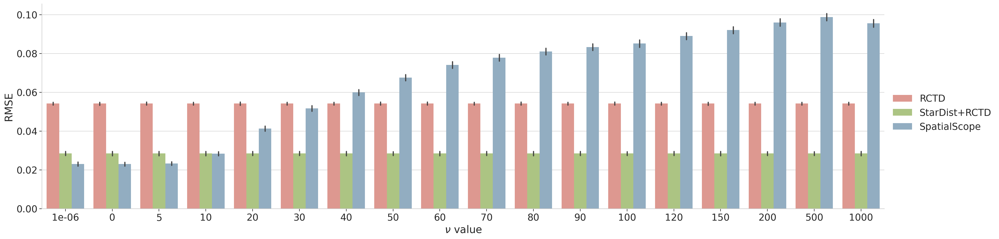

In [318]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('seaborn-whitegrid')

sns.set_context('paper',font_scale=2) 
fig, ax = plt.subplots(1,1, figsize = (28, 7), dpi = 150)
plt.subplots_adjust(hspace = 0.5)

with plt.style.context('seaborn-whitegrid'):
    sns.barplot(x="nu", y="value",hue='method',data=vis_decon_df[vis_decon_df.metric == 'rmse'], palette=['#EA8E83', '#AFCF78', '#8AAEC9'], ax = ax)
# ax.set_ylim(0.4,0.95)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.legend(bbox_to_anchor=(1,0.6))
#ax.set_yticks([0.84, 0.86, 0.88])
#ax.set_xticklabels(['130 UMIs','260 UMIs','520 UMIs'])
plt.ylabel('RMSE')
plt.xlabel(r'$\nu$ value')
plt.show()

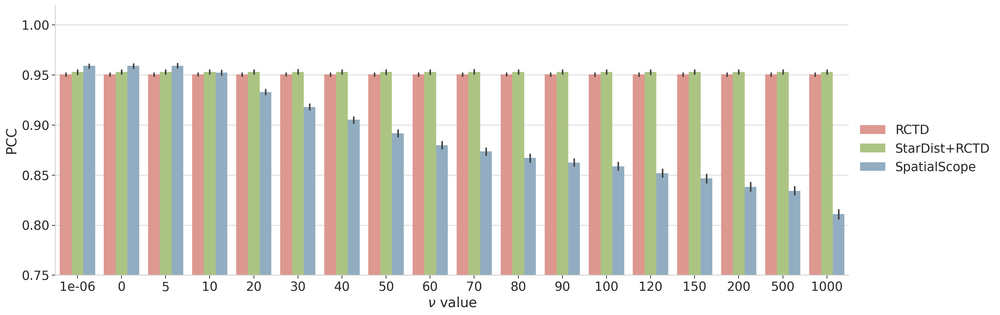

In [319]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('seaborn-whitegrid')

sns.set_context('paper',font_scale=2) 
fig, ax = plt.subplots(1,1, figsize = (20, 7), dpi = 150)
plt.subplots_adjust(hspace = 0.5)

with plt.style.context('seaborn-whitegrid'):
    sns.barplot(x="nu", y="value",hue='method',data=vis_decon_df[vis_decon_df.metric == 'pcc'], palette=['#EA8E83', '#AFCF78', '#8AAEC9'], ax = ax)
ax.set_ylim(0.75,1.02)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.legend(bbox_to_anchor=(1,0.6))
#ax.set_yticks([0.84, 0.86, 0.88])
#ax.set_xticklabels(['130 UMIs','260 UMIs','520 UMIs'])
plt.ylabel('PCC')
plt.xlabel(r'$\nu$ value')
plt.show()

## example results

In [131]:
os.path.join(DataDir, 'rep' + str(0))

'/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI/rep0'

In [32]:
DataDir = '/home/share/xwanaf/sour_sep/revision/data/RCTDnv_MBA/48x48/107UMI'
sp_adata = sc.read(os.path.join(DataDir, 'spatial.h5ad'))
# sp_cell_class_column = 

In [36]:
sp_adata = sc.read('/home/xwanaf/bio/multiSlices_SS/mouseOB/SpatialScope/demo_data/revision/benchmarking/MERFISH_MBA_sp.h5ad')
sc_adata = sc.read('/home/xwanaf/bio/multiSlices_SS/mouseOB/SpatialScope/demo_data/revision/benchmarking/MERFISH_MBA_scref.h5ad')

sp_cell_class_column = cell_class_column = 'cell_type_annot'

x_min = sp_adata.obs['x'].min()
x_max = sp_adata.obs['x'].max()
y_min = sp_adata.obs['y'].min()
y_max = sp_adata.obs['y'].max()

num_x = 48
num_y = 48

spatial_adata =  sp_adata.copy()

# make grid 
x_seg = np.linspace(x_min, x_max, num_x)
y_seg = np.linspace(y_min, y_max, num_y)


In [4]:
cell_locations = pd.read_csv(os.path.join(DataDir, 'rep' + str(0), 'CellTypeLabel_nu' + str(10) + '.csv'), index_col = 0)
cell_locations_small_nv = pd.read_csv(os.path.join(DataDir, 'rep' + str(0), 'CellTypeLabel_nu' + str(0.000001) + '.csv'), index_col = 0)
cell_locations_0_nv = pd.read_csv(os.path.join(DataDir, 'rep' + str(0), 'CellTypeLabel_nu' + str(0) + '.csv'), index_col = 0)

SR_results = sc.read(os.path.join(DataDir, 'rep' + str(0), 'SDRCTD_results/single_cell_type_label_bySDRCTD.h5ad'))
SR_cell_type_label = SR_results.uns['cell_locations'].copy()

In [143]:
sp_adata.obs[np.array(['x', 'y'])].to_csv(DataDir + '/gt_loc.txt')

In [141]:
gd_results.to_csv(DataDir + '/gt_res.txt')

## ground truth

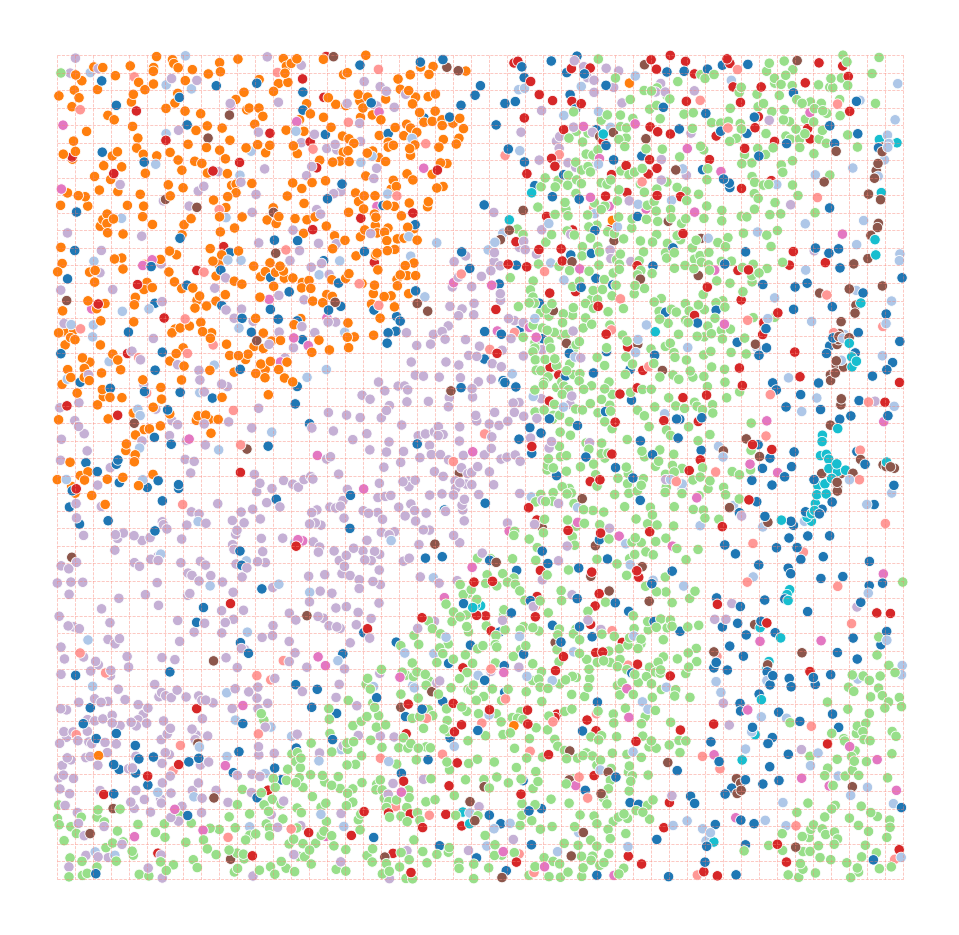

In [18]:
with mpl.rc_context({'figure.figsize': (8, 8), 'figure.dpi': 150}):
    ax = sns.scatterplot(data=cell_locations, x="x", y="y", hue=sp_cell_class_column, s = 25, palette = color_dict, legend = False)
    ax.invert_yaxis()
    for i in range(x_seg.shape[0]):
        ax.plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
    for i in range(y_seg.shape[0]):    
        ax.plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
#         ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.axis('off')

## SpatialScope

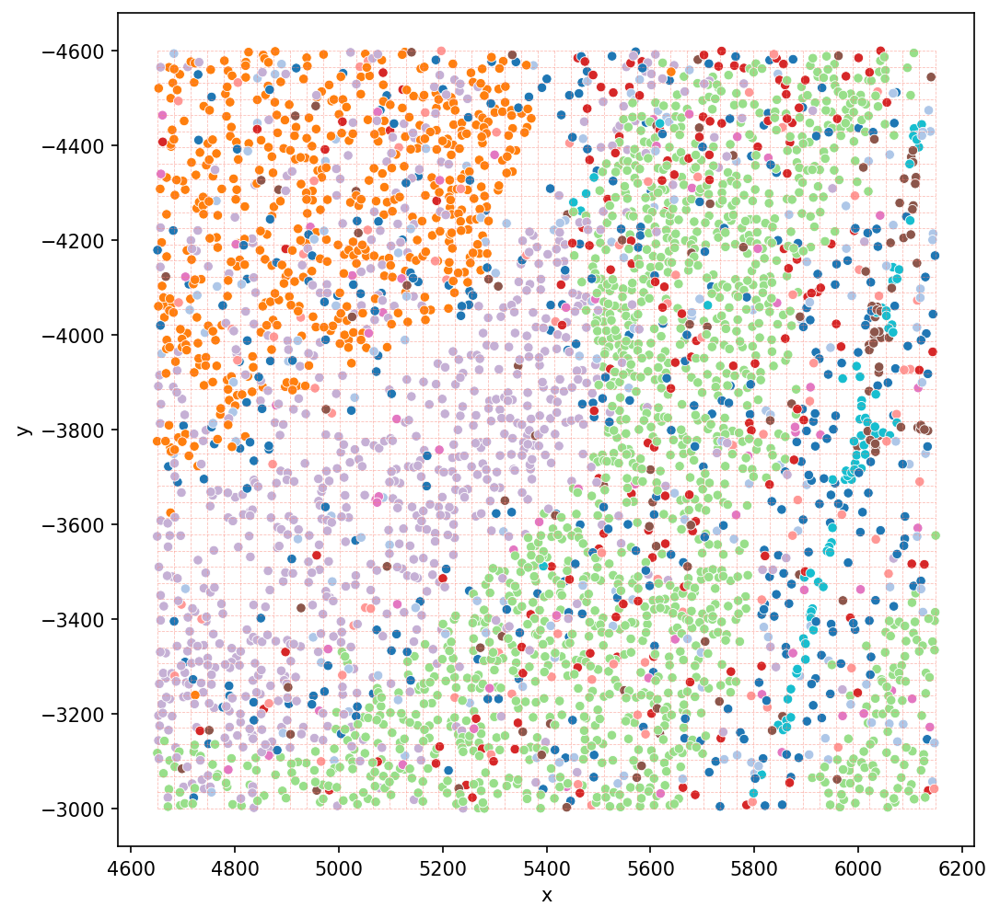

In [37]:
with mpl.rc_context({'figure.figsize': (8, 8), 'figure.dpi': 150}):
    ax = sns.scatterplot(data=cell_locations, x="x", y="y", hue='discrete_label_ct', s = 25, palette = color_dict, legend = False)
    ax.invert_yaxis()
    for i in range(x_seg.shape[0]):
        ax.plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
    for i in range(y_seg.shape[0]):    
        ax.plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
#         ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
#     ax.axis('off')

## Enlarge the region

In [61]:
x_seg

array([4650.25871009, 4682.14445482, 4714.03019955, 4745.91594428,
       4777.80168902, 4809.68743375, 4841.57317848, 4873.45892322,
       4905.34466795, 4937.23041268, 4969.11615741, 5001.00190215,
       5032.88764688, 5064.77339161, 5096.65913634, 5128.54488108,
       5160.43062581, 5192.31637054, 5224.20211528, 5256.08786001,
       5287.97360474, 5319.85934947, 5351.74509421, 5383.63083894,
       5415.51658367, 5447.4023284 , 5479.28807314, 5511.17381787,
       5543.0595626 , 5574.94530734, 5606.83105207, 5638.7167968 ,
       5670.60254153, 5702.48828627, 5734.374031  , 5766.25977573,
       5798.14552047, 5830.0312652 , 5861.91700993, 5893.80275466,
       5925.6884994 , 5957.57424413, 5989.45998886, 6021.34573359,
       6053.23147833, 6085.11722306, 6117.00296779, 6148.88871253])

In [62]:
np.where(x_left <= x_seg)[0][0], np.where(x_seg <= x_right)[0][-1]

(10, 18)

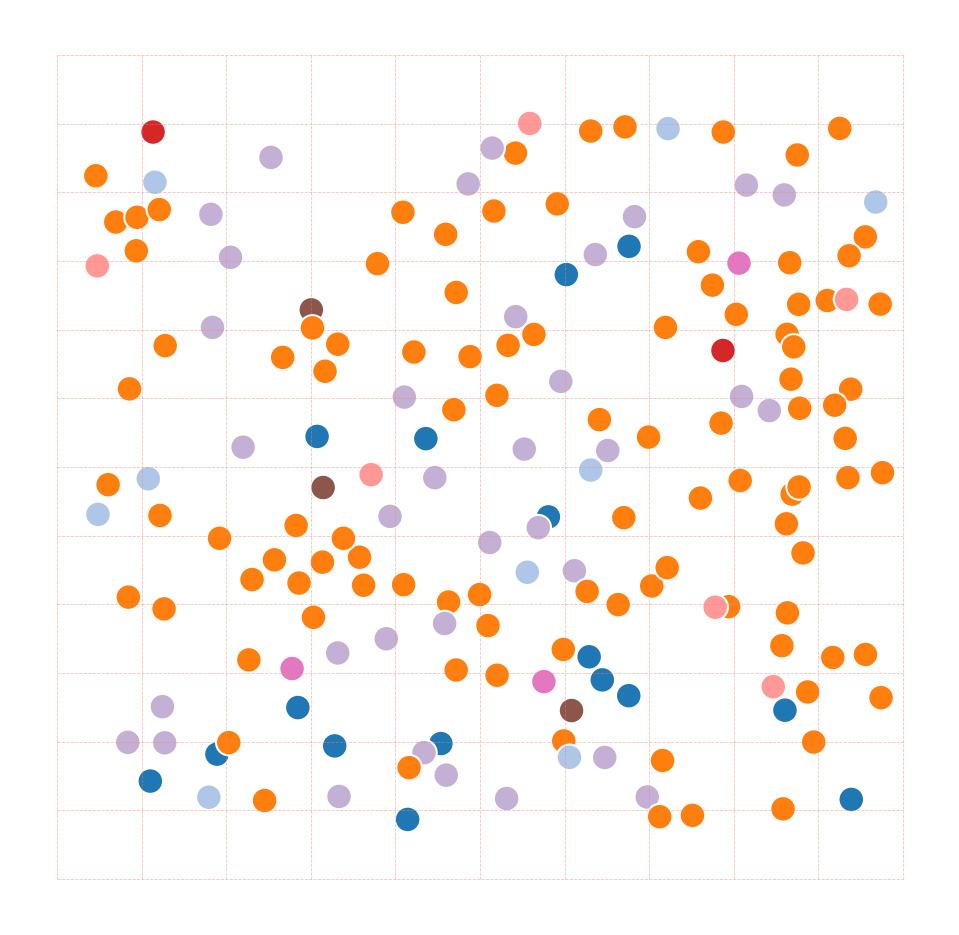

In [60]:
x_left = 4950
x_right = 5250
y_left = -4400
y_right = -4050
s = 150

sp_adata = sc.read('/home/xwanaf/bio/multiSlices_SS/mouseOB/SpatialScope/demo_data/revision/benchmarking/MERFISH_MBA_sp.h5ad')
sc_adata = sc.read('/home/xwanaf/bio/multiSlices_SS/mouseOB/SpatialScope/demo_data/revision/benchmarking/MERFISH_MBA_scref.h5ad')

sp_cell_class_column = cell_class_column = 'cell_type_annot'

x_min = sp_adata.copy().obs['x'].min()
x_max = sp_adata.copy().obs['x'].max()
y_min = sp_adata.copy().obs['y'].min()
y_max = sp_adata.copy().obs['y'].max()

num_x = 48
num_y = 48

spatial_adata =  sp_adata.copy()

# make grid 
x_seg = np.linspace(x_min, x_max, num_x)
y_seg = np.linspace(y_min, y_max, num_y)

x_seg_crop = x_seg[(np.where(x_left <= x_seg)[0][0] - 1): (np.where(x_seg <= x_right)[0][-1] + 2)]
y_seg_crop = y_seg[(np.where(y_left <= y_seg)[0][0] - 1): (np.where(y_seg <= y_right)[0][-1] + 2)]


with mpl.rc_context({'figure.figsize': (8, 8), 'figure.dpi': 150}):
    ax = sns.scatterplot(data=cell_locations.loc[(x_left <= cell_locations['x']) & (cell_locations['x'] <= x_right) & (y_left <= cell_locations['y']) & (cell_locations['y'] <= y_right),:], x="x", y="y", hue='discrete_label_ct', s = s, palette = color_dict, legend = False)
    ax.invert_yaxis()
    for i in range(x_seg_crop.shape[0]):
        ax.plot([x_seg_crop[i] for _ in y_seg_crop],y_seg_crop,linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
    for i in range(y_seg_crop.shape[0]):    
        ax.plot(x_seg_crop,[y_seg_crop[i] for _ in x_seg_crop],linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
#         ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.axis('off')

### nv = 0


In [326]:
x_seg[1] - x_seg[0], y_seg[1] - y_seg[0]

(31.88574473274548, 34.03559574484825)

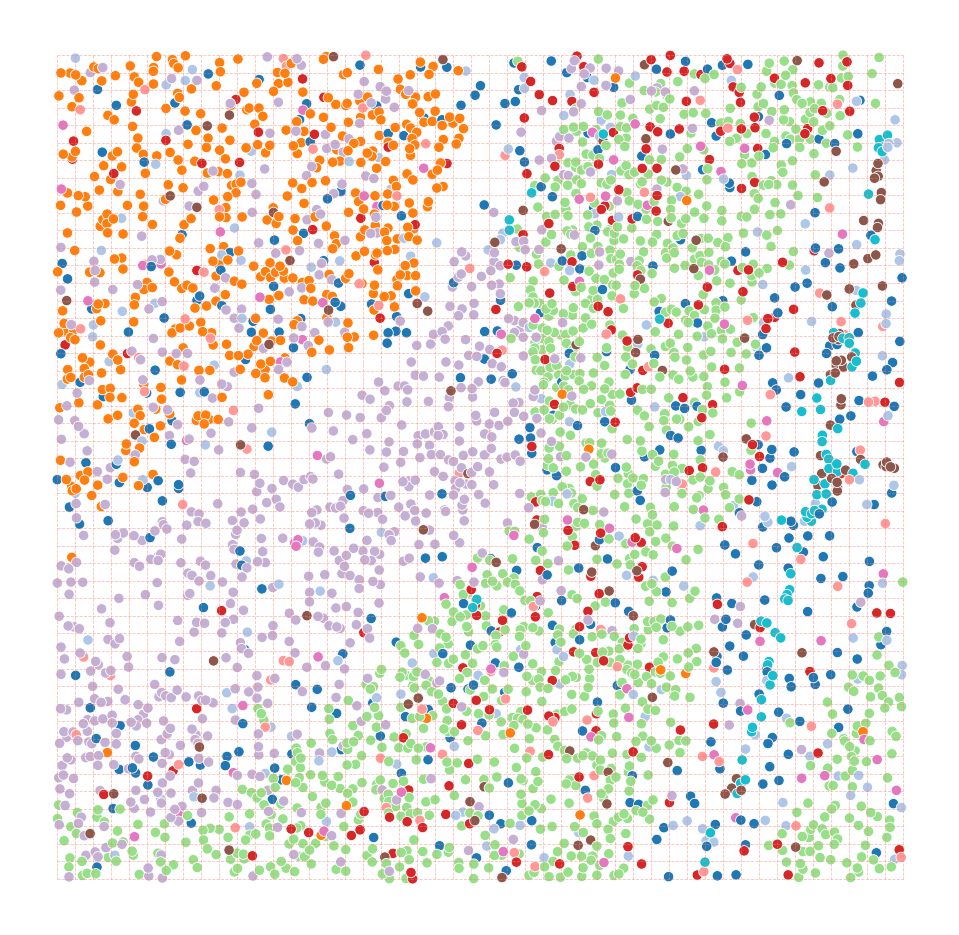

In [323]:
with mpl.rc_context({'figure.figsize': (8, 8), 'figure.dpi': 150}):
    ax = sns.scatterplot(data=cell_locations_0_nv, x="x", y="y", hue='discrete_label_ct', s = 25, palette = color_dict, legend = False)
    ax.invert_yaxis()
    for i in range(x_seg.shape[0]):
        ax.plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
    for i in range(y_seg.shape[0]):    
        ax.plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
#         ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.axis('off')

### nv = 0.000001

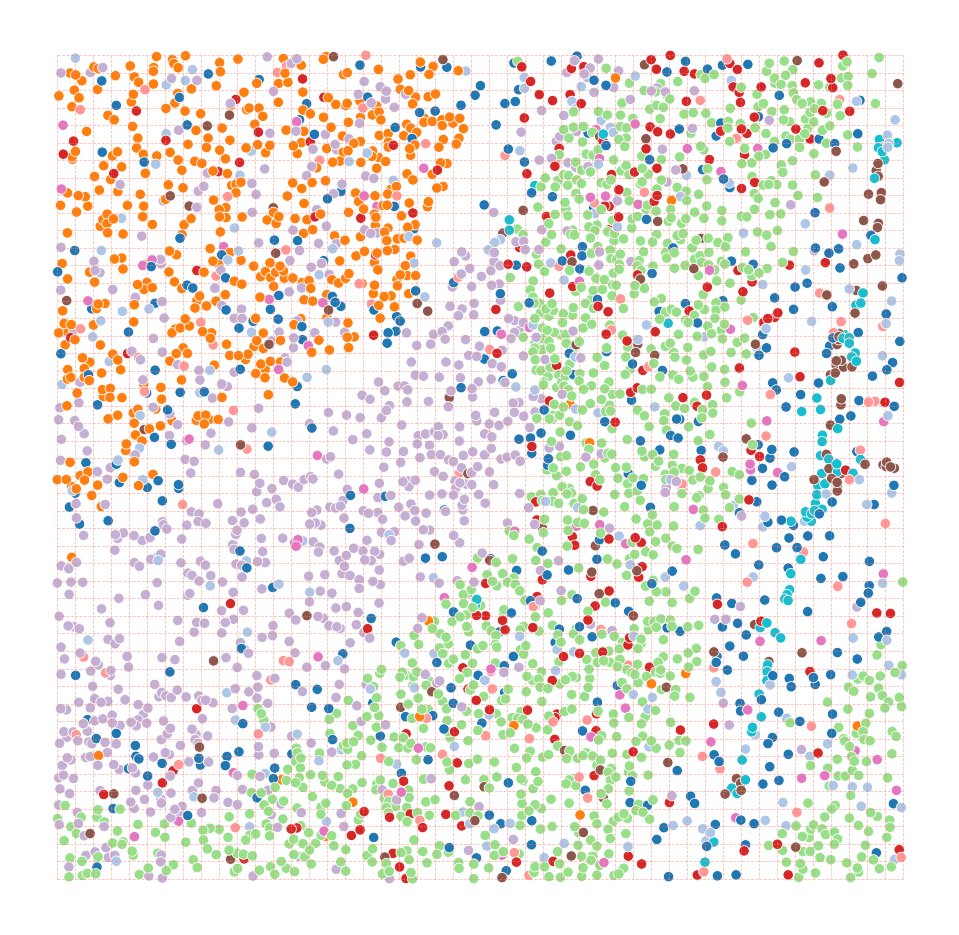

In [321]:
with mpl.rc_context({'figure.figsize': (8, 8), 'figure.dpi': 150}):
    ax = sns.scatterplot(data=cell_locations_small_nv, x="x", y="y", hue='discrete_label_ct', s = 25, palette = color_dict, legend = False)
    ax.invert_yaxis()
    for i in range(x_seg.shape[0]):
        ax.plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
    for i in range(y_seg.shape[0]):    
        ax.plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
#         ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.axis('off')

### StarDist + RCTD 

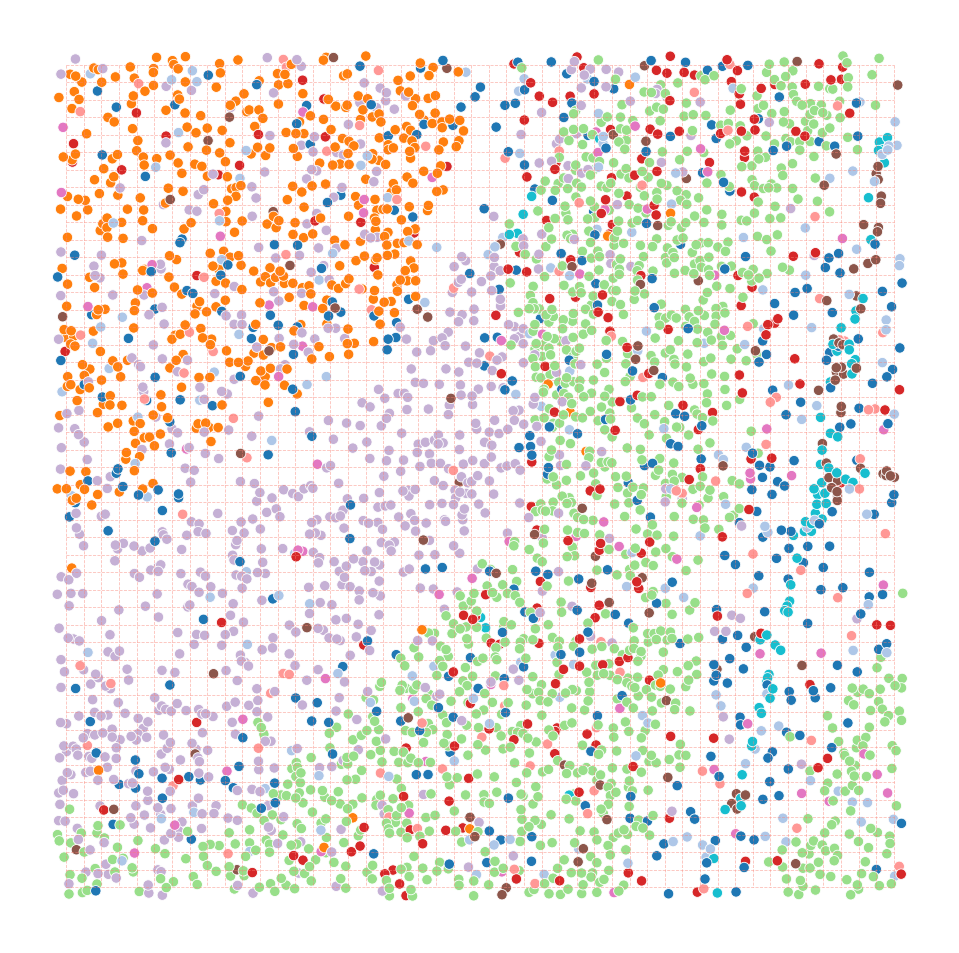

In [175]:
with mpl.rc_context({'figure.figsize': (8, 8), 'figure.dpi': 150}):
    ax = sns.scatterplot(data=SR_cell_type_label, x="x", y="y", hue='SDRCTD_cell_type', s = 25, palette = color_dict, legend = False)
    ax.invert_yaxis()
    for i in range(x_seg.shape[0]):
        ax.plot([x_seg[i] for _ in y_seg],y_seg,linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
    for i in range(y_seg.shape[0]):    
        ax.plot(x_seg,[y_seg[i] for _ in x_seg],linestyle='dashed', c = 'salmon', lw = .4, alpha = 0.5)
#         ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.axis('off')